#   <center> Проект 3: Прогнозирование рейтинга отеля на Booking

Представьте, что вы работаете датасаентистом в компании Booking. Одна из проблем компании — это нечестные отели, которые накручивают себе рейтинг. Одним из способов нахождения таких отелей является построение модели, которая предсказывает рейтинг отеля. Если предсказания модели сильно отличаются от фактического результата, то, возможно, отель играет нечестно, и его стоит проверить.

Вам поставлена задача создать такую модель

Необходимо повысить точность прогнозов, которые делает модель, с помощью более тщательной подготовки данных.

Задачу, можно свести к пяти пунктам:

  -      Удаление строковых значений. Вам необходимо удалить из набора данных столбцы, данные в которых представлены не числами.
  -      Очистка от пропущенных значений. На предыдущем шаге мы делали это самым грубым из всех возможных способов, сейчас попробуйте подойти к процессу более гибко.
  -      Создание новых признаков. Мы попробуем создать новые столбцы с данными из существующих данных или с использованием внешних источников.
  -      Преобразование признаков. Применим различные преобразования над признаками вроде нормализации, стандартизации.
  -      Отбор признаков. Используем анализ мультиколлинеарности как шаг отбора признаков для модели.

In [1]:
import time
from datetime import datetime

# Запоминаем текущее время перед выполнением ячеек
start_time = time.time()

In [2]:
# Simple and consistent geocoding library written in Python
# !pip install geocoder

In [3]:
# pip install ydata-profiling

In [4]:
# pip install -U ydata-profiling

In [5]:
# pip install category_encoders

In [6]:
# pip install haversine

In [7]:
# pip install wordcloud

In [8]:
# pip install textblob

In [9]:
# pip install Afinn

In [10]:
# pip install tidytext

In [11]:
# pip install --upgrade pip

In [12]:
# pip install playsound

In [13]:
# pip install pygame

In [14]:
# Импортируем необходимые библиотеки:

import numpy as np  # linear algebra
import pandas as pd  # data processing, CSV file I/O (e.g. pd.read_csv)
from scipy import stats
# from haversine import haversine, Unit
from ydata_profiling import ProfileReport # создаёт подробный отчёт по данным

# Импортируем библиотеки для визуализации
import matplotlib.pyplot as plt
import plotly.express as px
import seaborn as sns
%matplotlib inline

import nltk  # библиотека для анализа тональности текста
nltk.download('punkt')
# Загрузка лексикона для анализа тональности (VADER)
nltk.downloader.download('vader_lexicon')
from nltk.sentiment.vader import SentimentIntensityAnalyzer
#from nltk.sentiment import SentimentIntensityAnalyzer
from nltk.tokenize import word_tokenize
from afinn import Afinn # словарь, используемый для анализа настроений
from textblob import TextBlob
from wordcloud import WordCloud

# Загружаем специальный удобный инструмент для разделения датасета:
from sklearn.model_selection import train_test_split

# Инструмент для создания и обучения модели
from sklearn.ensemble import RandomForestRegressor
import category_encoders as ce  # импорт для работы с кодировщиком

from sklearn.feature_selection import chi2  # хи-квадрат
from sklearn.feature_selection import f_classif # anova
from sklearn import metrics  # инструменты для оценки точности модели
from sklearn.preprocessing import RobustScaler

import os
import pygame
import platform
import psutil

# Делаем визуальную настройку графиков
sns.set_theme("notebook")
sns.set_palette("Set2")

C:\Users\Usr\anaconda3\lib\site-packages\scipy\__init__.py:146: UserWarning: A NumPy version >=1.16.5 and <1.23.0 is required for this version of SciPy (detected version 1.23.5
  warnings.warn(f"A NumPy version >={np_minversion} and <{np_maxversion}"
[nltk_data] Downloading package punkt to
[nltk_data]     C:\Users\Usr\AppData\Roaming\nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package vader_lexicon to
[nltk_data]     C:\Users\Usr\AppData\Roaming\nltk_data...
[nltk_data]   Package vader_lexicon is already up-to-date!


pygame 2.5.2 (SDL 2.28.3, Python 3.9.12)
Hello from the pygame community. https://www.pygame.org/contribute.html


In [15]:
# зафиксируем версию пакетов, чтобы эксперименты были воспроизводимы:
!pip freeze > requirements.txt

In [16]:
# Получаем текущую директорию
current_directory = os.getcwd()

# Строим путь к директории выше текущей
parent_directory = os.path.join(current_directory, os.pardir)

# Строим путь к файлу в папке "media"
file_path = os.path.join(parent_directory, "media", "arcade-retro-game-over-213.wav")

# Преобразуем путь в абсолютный
file_path = os.path.abspath(file_path)

# Для запуска звукового сигнала
pygame.mixer.init()
pygame.mixer.music.load(file_path)

In [17]:
# Ограничение на вывод информации
#pd.set_options('display.max_rows', None)
pd.set_option('display.max_columns', 500)
pd.set_option('display.max_colwidth', None)
pd.set_option('display.width', 1000)

In [18]:
# всегда фиксируйте RANDOM_SEED, чтобы ваши эксперименты были воспроизводимы!
RANDOM_SEED = 42

In [19]:
# Включаем кодирование национальностей
nationality_encoding = True

In [20]:
# Количество Топ национальностей, которое будет кодироваться
TOP_N = 20

In [21]:
# Кодирование с помощью лексикона Afinn
afinn_encoding = True

In [22]:
sia_two_features_encoding = False

In [23]:
sia_four_features_encoding = False

In [24]:
# sia_two + sia_four
sia_combined_features_encoding = True

In [25]:
# Включение кодирования тегов
tag_encoding = True

In [26]:
# Количество Топ тегов
TOP_tags = 20

In [27]:
# Генерация новых признаков: 'neg_review_length_ratio' и 'pos_review_length_ratio'
review_length_ratio = True

In [28]:
# Генерация новых признаков: 'neg_average_score' и 'pos_average_score'
words_ratio = True 

In [29]:
# Генерация новых признаков: 'negative_words_ratio' и 'positive_words_ratio'
mod_average_score = True

In [30]:
# Включаем нормализацию
normalize = False

In [31]:
# Задаём уровень значимости
alpha = 0.05
print("Уровень значимости alpha = {:.2f}".format(alpha))

Уровень значимости alpha = 0.05


In [32]:
threshold_num = 0.7
threshold_cut = 0.9

In [33]:
# Удаление сильно скореллированных признаков, вариант 1 - drop num1, num2
drop_variant1 = False

In [34]:
# Удаление сильно скореллированных признаков, вариант 2 - drop cut1, cut2
drop_variant2 = False

In [35]:
# Удаление сильно скореллированных признаков, вариант 3 - drop num1, cut1
drop_variant3 = False

In [36]:
# Удаление сильно скореллированных признаков, вариант 4 - drop num2, cut2
drop_variant4 = False

In [37]:
# Удаление наименее значимых категориальных признаков
drop_less_sign_cat_features = False

In [38]:
# Удаление части наименее значимых непрерывных признаков
manual_removal = True

# 0. Дополнительные функции

In [39]:
def info_by_column_type(dataframe):
    """
    Выводит информацию о типе данных в каждом столбце датафрейма.

    Parameters:
    - dataframe (pd.DataFrame): Входной датафрейм.

    Returns:
    - None: Выводит информацию на экран.
    """
    for column in dataframe.columns:
        column_data_type = type(dataframe[column].iloc[0])
        print(f"Тип данных в столбце '{column}': {column_data_type}")


def plot_distribution(data, feature, title):
    """
    Строит гистограмму и boxplot для заданного признака.

    Parameters:
    - data (pd.DataFrame): Датафрейм с данными.
    - feature (str): Название признака для построения графика.
    - title (str): Название графика.

    Returns:
    - None: Выводит графики на экран.
    """
    # Создание фигуры с двумя подграфиками (1 строка, 2 столбца) и задание размера фигуры
    fig, axes = plt.subplots(1, 2, figsize=(15, 5))

    # Построение гистограммы для распределения признака
    sns.histplot(data[feature], kde=True, ax=axes[0], bins=20)
    axes[0].set(xlabel=f'{feature}', ylabel='Частота')
    axes[0].set_title('Распределение ' + title)

    # Добавление вертикальной линии, отображающей среднее значение признака, выделенное красным цветом.
    axes[0].axvline(data[feature].mean(), color='red',
                    linestyle='--', linewidth=0.8)

    # Построение boxplot для визуализации статистических характеристик распределения признака.
    sns.boxplot(x=data[feature], ax=axes[1], orient='h',
                medianprops={"color": "red", "linestyle": '--'})
    # axes[1].set(ylabel=f'{feature}')
    axes[1].set_title('Boxplot ' + title)

    # Отображение созданных графиков.
    plt.show()


def normalize_and_plot(data, feature_name, new_feature_name, title_suffix=''):
    """
    Нормализует указанный признак, создает новый признак и строит графики распределения.

    Parameters:
    - data (pd.DataFrame): Исходный DataFrame.
    - feature_name (str): Имя признака, который необходимо нормализовать.
    - new_feature_name (str): Имя нового нормализованного признака.
    - title_suffix (str): Дополнительный текст для заголовка графика (по умолчанию пусто).

    Returns:
    - data (pd.DataFrame): DataFrame с новым нормализованным признаком.
    """

    # Инициализируем нормализатор RobustScaler
    robust_scaler = RobustScaler()

    # Нормализуем указанный признак и создаем новый нормализованный признак
    data[new_feature_name] = robust_scaler.fit_transform(data[[feature_name]])

    # Строим графики распределения
    plot_distribution(data, new_feature_name,
                      f'нормализованный {title_suffix}')

    return data


def chart_score_column(
    df,                  # DataFrame
    col,                 # Имя столбца
    title,               # Заголовок графика
    xlabel,              # Подпись оси X
    ylabel,              # Подпись оси Y

    size=[10, 5],        # Размер графика
    ylim=[5, 7],         # Мин/Макс значения на оси Y

                         # Размеры шрифтов:
    title_fontsize=16,   # Заголовок
    ticks_fontsize=12,   # Оси
    xlabel_fontsize=14,  # Подпись оси X
    xticks_rotation=0,   # Поворот подписей оси X
    ylabel_fontsize=14   # Подпись оси Y
):
    """
    Визуализация средних оценок относительно заданного столбца.

    Parameters:
    - df (pd.DataFrame): Датафрейм с данными.
    - col (str): Название столбца, относительно которого строится график.
    - title (str): Заголовок графика.
    - xlabel (str): Подпись оси X.
    - ylabel (str): Подпись оси Y.

    Returns:
    - None: Выводит график на экран.
    """

    # Группировка данных по заданному столбцу и расчет среднего значения оценок
    grouped = df.groupby(col)['reviewer_score'].agg(
        ['mean']).sort_values('mean')

    # Создание графика
    fig, ax = plt.subplots(figsize=(size[0], size[1]))

    # Заголовок графика
    plt.suptitle(title, size=title_fontsize)

    # Столбчатая диаграмма
    bar_types = sns.barplot(
        x=grouped.index, y=grouped['mean'], palette='pastel')

    # Аннотации средних значений над столбцами
    for p in bar_types.patches:
        bar_types.annotate('{:.2f}'.format(p.get_height()), (p.get_x()+.4, p.get_height()),
                           ha='center', va='bottom', fontsize=int((title_fontsize + ticks_fontsize) / 2))

    # Установка пределов оси Y
    plt.ylim(ylim[0], ylim[1])

    # Подпись оси X
    plt.xlabel(xlabel, size=xlabel_fontsize)

    # Подпись оси Y
    plt.ylabel(ylabel, size=ylabel_fontsize)

    # Размеры шрифтов для делений на осях
    plt.xticks(fontsize=ticks_fontsize)

    # Поворот подписей оси X
    plt.xticks(rotation=xticks_rotation)

    # Показать график
    plt.show()


def classify_features(data):
    """
    Классифицирует признаки в датафрейме на числовые и категориальные.

    :param dataframe: pandas DataFrame, входные данные для классификации признаков.
    :return: Кортеж из двух списков: список числовых признаков и список категориальных признаков.
    """
    # Список для числовых признаков
    numerical_features = data.select_dtypes(include=['number']).columns.tolist()

    # Список для категориальных признаков
    categorical_features = data.select_dtypes(
        exclude=['number']).columns.tolist()

    return numerical_features, categorical_features


def analyze_categorical_feature(data, column):
    """
    Анализ и визуализация категориального признака.

    :param data: pandas DataFrame, исходные данные.
    :param column: str, название категориального столбца.
    """
    # Подсчет уникальных значений
    unique_values = data[column].value_counts()

    # Вывод уникальных значений
    print(f"Уникальные значения в столбце {column}:\n{unique_values}\n")


def extract_city_country(hotel_address):
    """
    Извлекает город и страну из строки адреса отеля.

    Parameters:
    - hotel_address (str): Строка с адресом отеля.

    Returns:
    - tuple: Кортеж, содержащий город и страну.
    """
    # Разбиваем строку на слова
    words = hotel_address.split()

    # Проверяем последнее слово
    if words[-1] == 'Kingdom':
        country = 'UK'
        city = words[-5]
    else:
        country = words[-1]
        city = words[-2]

    return city, country


def is_chain_hotel(hotel_name, chain_list):
    """
    Функция проверяет, содержится ли в названии отеля какой-либо элемент из списка.

    :param hotel_name: Название отеля для проверки.
    :param chain_list: Список для проверки принадлежности элемента.
    :return: 1, если отель содержит элемент из списка, иначе 0.
    """
    return 1 if any(chain in hotel_name for chain in chain_list) else 0


def process_nationality(nationality, top_nationalities):
    """
    Функция для обработки признака национальности.

    Параметры:
    - nationality: str, национальность
    - top_nationalities: list, список топ-национальностей

    Возвращает:
    - str, новое значение национальности
    """
    return nationality if nationality in top_nationalities else 'other'


def process_tags(tags_str):
    """
    Преобразует строку с тегами в список тегов.

    Parameters:
    tags_str (str): Строка с тегами.

    Returns:
    list: Список тегов.
    """
    # Разбиваем строку по запятой и убираем лишние пробелы, одинарные кавычки и квадратные скобки
    tags_list = [tag.strip(" '[]") for tag in tags_str.split(',')]
    return tags_list


def show_wordcloud(data, title=None):
    """
    Отображение облака слов на основе входных данных.

    Параметры:
    - data: Входные данные для генерации облака слов.
    - title: Необязательное название для графика облака слов.

    Возвращает:
    None
    """
    wordcloud = WordCloud(
        background_color='white',  # Цвет фона
        max_words=200,  # Максимальное количество слов
        max_font_size=40,  # Максимальный размер шрифта
        scale=3,  # Масштаб
        random_state=42  # Задаем начальное значение для воспроизводимости
    ).generate(str(data))

    fig = plt.figure(1, figsize=(20, 20))
    plt.axis('off')
    if title:
        fig.suptitle(title, fontsize=20)
        fig.subplots_adjust(top=2.3)

    plt.imshow(wordcloud)
    plt.show()


def decision_normality(p):
    """
    Функция для принятия решения о нормальности.

    :param p: float, p-значение для проверки нормальности распределения.
    """
    print('p-value = {:.3f}'.format(p))
    if p <= alpha:
        print(
            'p-значение меньше, чем заданный уровень значимости {:.2f}. Распределение отлично от нормального'.format(alpha))
    else:
        print(
            'p-значение больше, чем заданный уровень значимости {:.2f}. Распределение является нормальным'.format(alpha))


def decision_hypothesis(p):
    """
    Функция для принятия решения об отклонении нулевой гипотезы.

    :param p: float, p-значение для принятия решения о нулевой гипотезе.
    """
    print('p-value = {:.3f}'.format(p))
    if p <= alpha:
        print(
            'p-значение меньше, чем заданный уровень значимости {:.2f}. Отвергаем нулевую гипотезу в пользу альтернативной.'.format(alpha))
    else:
        print(
            'p-значение больше, чем заданный уровень значимости {:.2f}. У нас нет оснований отвергнуть нулевую гипотезу.'.format(alpha))


def triang_corr_heatmap(df, columns, title, exclude_features=None, method='pearson', corr_coeff_threshold=0.7):
    """
    Функция для построения тепловой карты корреляционной диаграммы с учетом категориальных признаков.

    Параметры:
    - df: DataFrame с данными.
    - columns: Список столбцов для построения корреляционной диаграммы.
    - title: Заголовок для корреляционной диаграммы.
    - method: Метод расчета корреляции (например: 'pearson', 'spearman', 'kendall').
    - corr_coeff_threshold: Пороговое значение коэффициента корреляции.
    - exclude_features: Список признаков, которые нужно исключить из матрицы корреляции.

    Возвращает:
    - feature_list_1: Список уникальных значений признаков feature_pair[0].
    - feature_list_2: Список уникальных значений признаков feature_pair[1].
    """
    

    # Создание фигуры и осей
    fig, ax = plt.subplots(figsize=(15, 12))

    # Расчет корреляции
    corr = df[columns].corr(method=method)

    # # Исключаем необходимые признаки при расчете корреляции
    if exclude_features:
        # Исключаем необходимые признаки при расчете корреляции
        corr = corr.loc[~corr.index.isin(exclude_features), ~corr.columns.isin(exclude_features)]
        # Удаление исключаемых признаков
        # corr = corr.drop(exclude_features, axis=0).drop(exclude_features, axis=1, errors='ignore')
        
    # Создание маски для треугольника
    mask = np.triu(np.ones_like(corr, dtype=bool))

    # Фильтрация корреляций по порогу
    filtered_corr = corr[(corr.abs() > corr_coeff_threshold) & (corr < 1.0)]

    # Построение корреляционной диаграммы
    sns.heatmap(filtered_corr, annot=True, linewidths=0.1, ax=ax,
                mask=mask, cmap='plasma', fmt='.1g')

    # Установка заголовка
    ax.set_title(title, fontsize=18)

    # Отображение диаграммы
    plt.show()

    # Печать списка признаков
    correlated_features = filtered_corr.stack().index.tolist()

    # Печать списка коррелирующих признаков
    seen_pairs = set()
    feature_list_1 = []
    feature_list_2 = []

    print("Коррелирующие признаки:")
    for feature_pair in correlated_features:
        pair = tuple(sorted(feature_pair))
        if pair not in seen_pairs:
            feature_list_1.append(feature_pair[0])
            feature_list_2.append(feature_pair[1])
            print(f"{feature_pair[0]} и {feature_pair[1]}")
            seen_pairs.add(pair)

    return list(set(feature_list_1)), list(set(feature_list_2))      

# 1. Исследование структуры данных

In [40]:
df_train = pd.read_csv('data/hotels_train.csv')  # датасет для обучения
df_test = pd.read_csv('data/hotels_test.csv')  # датасет для предсказания
sample_submission = pd.read_csv('data/submission.csv')  # самбмишн

## Признаки

 -   hotel_address - адрес отеля
 -   review_date - дата, когда рецензент разместил соответствующий отзыв.
 -   average_score - средний балл отеля, рассчитанный на основе последнего комментария за последний год
 -   hotel_name - название отеля
 -   reviewer_nationality - национальность рецензента
 -   negative_review - отрицательный отзыв, который рецензент дал отелю.
 -   review_total_negative_word_counts - общее количество слов в отрицательном отзыв
 -   positive_review - положительный отзыв, который рецензент дал отелю
 -   review_total_positive_word_counts - общее количество слов в положительном отзыве
 -   reviewer_score - оценка, которую рецензент поставил отелю на основе своего опыта
 -   total_number_of_reviews_reviewer_has_given - количество отзывов, которые рецензенты дали в прошлом
 -   total_number_of_reviews - общее количество действительных отзывов об отеле
 -   tags - теги, которые рецензент дал отелю.
 -   days_since_review - продолжительность между датой проверки и датой очистки
 -   additional_number_of_scoring - есть также некоторые гости, которые просто поставили оценку сервису, а не оставили 
     отзыв. Это число указывает, сколько там действительных оценок без проверки.
 -   lat - широта отеля
 -   lng - долгота отеля


In [41]:
df_train.head(3)

,hotel_address,additional_number_of_scoring,review_date,average_score,hotel_name,reviewer_nationality,negative_review,review_total_negative_word_counts,total_number_of_reviews,positive_review,review_total_positive_word_counts,total_number_of_reviews_reviewer_has_given,reviewer_score,tags,days_since_review,lat,lng
0,Stratton Street Mayfair Westminster Borough London W1J 8LT United Kingdom,581,2/19/2016,8.4,The May Fair Hotel,United Kingdom,Leaving,3,1994,Staff were amazing,4,7,10.0,"[' Leisure trip ', ' Couple ', ' Studio Suite ', ' Stayed 2 nights ', ' Submitted from a mobile device ']",531 day,51.507894,-0.143671
1,130 134 Southampton Row Camden London WC1B 5AF United Kingdom,299,1/12/2017,8.3,Mercure London Bloomsbury Hotel,United Kingdom,poor breakfast,3,1361,location,2,14,6.3,"[' Business trip ', ' Couple ', ' Standard Double Room ', ' Stayed 1 night ']",203 day,51.521009,-0.123097
2,151 bis Rue de Rennes 6th arr 75006 Paris France,32,10/18/2016,8.9,Legend Saint Germain by Elegancia,China,No kettle in room,6,406,No Positive,0,14,7.5,"[' Leisure trip ', ' Solo traveler ', ' Modern Double Room Echo ', ' Stayed 3 nights ', ' Submitted from a mobile device ']",289 day,48.845377,2.325643


In [42]:
df_train.tail(3)

,hotel_address,additional_number_of_scoring,review_date,average_score,hotel_name,reviewer_nationality,negative_review,review_total_negative_word_counts,total_number_of_reviews,positive_review,review_total_positive_word_counts,total_number_of_reviews_reviewer_has_given,reviewer_score,tags,days_since_review,lat,lng
386800,29 31 Gower Street Camden London WC1E 6HG United Kingdom,457,2/7/2016,6.8,Bloomsbury Palace Hotel,Netherlands,room is really small but guess is normal in London,12,2751,great location simple check in out nice shower,9,21,8.3,"[' Business trip ', ' Solo traveler ', ' Single Room ', ' Stayed 1 night ']",543 day,51.520795,-0.131084
386801,31 Great Cumberland Place Westminster Borough London W1H 7TA United Kingdom,365,5/21/2017,8.1,The Marble Arch London,United Arab Emirates,No Negative,0,1567,Location and very comfy bed,6,28,9.2,"[' Leisure trip ', ' Solo traveler ', ' Deluxe Double Room ', ' Stayed 2 nights ']",74 days,51.515125,-0.160066
386802,25 Courtfield Gardens Kensington and Chelsea London SW5 0PG United Kingdom,222,8/5/2016,9.0,The Nadler Kensington,Australia,Patio outside could have been cleaned of algae to give a more uplifting atmosphere to a downstairs room,20,1209,Beds comfortable Pillows also good Homely feel although room was small Staff very pleasant and helpful thank you,20,2,8.8,"[' Leisure trip ', ' Couple ', ' Bunk Bed Room ', ' Stayed 4 nights ']",363 day,51.493109,-0.190208


In [43]:
df_train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 386803 entries, 0 to 386802
Data columns (total 17 columns):
 #   Column                                      Non-Null Count   Dtype  
---  ------                                      --------------   -----  
 0   hotel_address                               386803 non-null  object 
 1   additional_number_of_scoring                386803 non-null  int64  
 2   review_date                                 386803 non-null  object 
 3   average_score                               386803 non-null  float64
 4   hotel_name                                  386803 non-null  object 
 5   reviewer_nationality                        386803 non-null  object 
 6   negative_review                             386803 non-null  object 
 7   review_total_negative_word_counts           386803 non-null  int64  
 8   total_number_of_reviews                     386803 non-null  int64  
 9   positive_review                             386803 non-null  object 
 

In [44]:
df_test.head(3)

,hotel_address,additional_number_of_scoring,review_date,average_score,hotel_name,reviewer_nationality,negative_review,review_total_negative_word_counts,total_number_of_reviews,positive_review,review_total_positive_word_counts,total_number_of_reviews_reviewer_has_given,tags,days_since_review,lat,lng
0,Via Senigallia 6 20161 Milan Italy,904,7/21/2017,8.1,Hotel Da Vinci,United Kingdom,Would have appreciated a shop in the hotel that sold drinking water etc but not necessity Would recommend if like us you arrive late at night to bring drinks from plane airport as there s no shop nearby There is a minibar though if you want to pay those prices,52,16670,Hotel was great clean friendly staff free breakfast every morning with good selection good wifi connection nice sized room with bath fridge in room Personally loved the fact that the hotel isn t in the city centre but is literally next to a train station that you can easily get to and from the airport city Would definitely stay again,62,1,"[' Leisure trip ', ' Couple ', ' Double Room ', ' Stayed 2 nights ']",13 days,45.533137,9.171102
1,Arlandaweg 10 Westpoort 1043 EW Amsterdam Netherlands,612,12/12/2016,8.6,Urban Lodge Hotel,Belgium,No tissue paper box was present at the room,10,5018,No Positive,0,7,"[' Leisure trip ', ' Group ', ' Triple Room ', ' Stayed 1 night ']",234 day,52.385649,4.834443
2,Mallorca 251 Eixample 08008 Barcelona Spain,46,11/26/2015,8.3,Alexandra Barcelona A DoubleTree by Hilton,Sweden,Pillows,3,351,Nice welcoming and service,5,15,"[' Business trip ', ' Solo traveler ', ' Twin Room ', ' Stayed 1 night ', ' Submitted from a mobile device ']",616 day,41.393192,2.161520


In [45]:
df_test.tail(3)

,hotel_address,additional_number_of_scoring,review_date,average_score,hotel_name,reviewer_nationality,negative_review,review_total_negative_word_counts,total_number_of_reviews,positive_review,review_total_positive_word_counts,total_number_of_reviews_reviewer_has_given,tags,days_since_review,lat,lng
128932,Wiedner Hauptstra e 44 04 Wieden 1040 Vienna Austria,260,7/6/2017,8.0,Suite Hotel 900 m zur Oper,New Zealand,No coffee in complimentary coffee in the room Had to use the same towel for two days wasn t replaced Breakfast needs more continental muesli options to choose from,31,3461,The size of the room the courtyard and the location to the city centre Staff members were also really friendly and nice,23,1,"[' Business trip ', ' Solo traveler ', ' Single Room ', ' Stayed 2 nights ']",28 days,48.193523,16.366915
128933,Corso Concordia 1 Milan City Center 20129 Milan Italy,159,12/26/2015,9.0,Ch teau Monfort Relais Ch teaux,Australia,No Negative,0,1053,Staff very polite and helpful Hotel well located and quiet Room and common areas well kept and clean,20,7,"[' Leisure trip ', ' Solo traveler ', ' Executive Double or Twin Room ', ' Stayed 3 nights ', ' Submitted from a mobile device ']",586 day,45.468236,9.207380
128934,202 rue de Rivoli 1st arr 75001 Paris France,297,12/23/2015,8.0,Saint James Albany Paris Hotel Spa,United Kingdom,rooms were very dated and old fashion,8,2868,No Positive,0,1,"[' Leisure trip ', ' Couple ', ' Standard Room with Spa access ', ' Stayed 2 nights ']",589 day,48.864269,2.330818


In [46]:
df_test.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 128935 entries, 0 to 128934
Data columns (total 16 columns):
 #   Column                                      Non-Null Count   Dtype  
---  ------                                      --------------   -----  
 0   hotel_address                               128935 non-null  object 
 1   additional_number_of_scoring                128935 non-null  int64  
 2   review_date                                 128935 non-null  object 
 3   average_score                               128935 non-null  float64
 4   hotel_name                                  128935 non-null  object 
 5   reviewer_nationality                        128935 non-null  object 
 6   negative_review                             128935 non-null  object 
 7   review_total_negative_word_counts           128935 non-null  int64  
 8   total_number_of_reviews                     128935 non-null  int64  
 9   positive_review                             128935 non-null  object 
 

In [47]:
sample_submission.head(3)

,reviewer_score,id
0,1,488440
1,10,274649
2,3,374688


In [48]:
sample_submission.tail(3)

,reviewer_score,id
128932,3,511968
128933,6,303386
128934,5,103157


In [49]:
sample_submission.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 128935 entries, 0 to 128934
Data columns (total 2 columns):
 #   Column          Non-Null Count   Dtype
---  ------          --------------   -----
 0   reviewer_score  128935 non-null  int64
 1   id              128935 non-null  int64
dtypes: int64(2)
memory usage: 2.0 MB


In [50]:
# ВАЖНО! дря корректной обработки признаков объединяем трейн и тест в один датасет
df_train['sample'] = 1 # помечаем где у нас трейн
df_test['sample'] = 0 # помечаем где у нас тест
df_test['reviewer_score'] = 0 # в тесте у нас нет значения reviewer_score, мы его должны предсказать, по этому пока просто заполняем нулями
data = pd.concat([df_train, df_test], ignore_index = True) #data = df_test.append(df_train, sort=False).reset_index(drop=True) # объединяем

In [51]:
data.head(3)

,hotel_address,additional_number_of_scoring,review_date,average_score,hotel_name,reviewer_nationality,negative_review,review_total_negative_word_counts,total_number_of_reviews,positive_review,review_total_positive_word_counts,total_number_of_reviews_reviewer_has_given,reviewer_score,tags,days_since_review,lat,lng,sample
0,Stratton Street Mayfair Westminster Borough London W1J 8LT United Kingdom,581,2/19/2016,8.4,The May Fair Hotel,United Kingdom,Leaving,3,1994,Staff were amazing,4,7,10.0,"[' Leisure trip ', ' Couple ', ' Studio Suite ', ' Stayed 2 nights ', ' Submitted from a mobile device ']",531 day,51.507894,-0.143671,1
1,130 134 Southampton Row Camden London WC1B 5AF United Kingdom,299,1/12/2017,8.3,Mercure London Bloomsbury Hotel,United Kingdom,poor breakfast,3,1361,location,2,14,6.3,"[' Business trip ', ' Couple ', ' Standard Double Room ', ' Stayed 1 night ']",203 day,51.521009,-0.123097,1
2,151 bis Rue de Rennes 6th arr 75006 Paris France,32,10/18/2016,8.9,Legend Saint Germain by Elegancia,China,No kettle in room,6,406,No Positive,0,14,7.5,"[' Leisure trip ', ' Solo traveler ', ' Modern Double Room Echo ', ' Stayed 3 nights ', ' Submitted from a mobile device ']",289 day,48.845377,2.325643,1


## 1.1. Отчёт Pandas Profilin

In [52]:
profile = ProfileReport(data, title="Pandas Profiling Report")

profile

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

## 1.2. Обзор общей информации о данных:

In [53]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 515738 entries, 0 to 515737
Data columns (total 18 columns):
 #   Column                                      Non-Null Count   Dtype  
---  ------                                      --------------   -----  
 0   hotel_address                               515738 non-null  object 
 1   additional_number_of_scoring                515738 non-null  int64  
 2   review_date                                 515738 non-null  object 
 3   average_score                               515738 non-null  float64
 4   hotel_name                                  515738 non-null  object 
 5   reviewer_nationality                        515738 non-null  object 
 6   negative_review                             515738 non-null  object 
 7   review_total_negative_word_counts           515738 non-null  int64  
 8   total_number_of_reviews                     515738 non-null  int64  
 9   positive_review                             515738 non-null  object 
 

In [54]:
# Получаем информацию о типе данных в каждом столбце

# info_by_column_type(data)

In [55]:
# Выявление числовых и категориальных признаков
numerical_features, categorical_features = classify_features(data)
print("\n Числовые признаки:", numerical_features)
print("\n Категориальные признаки:", categorical_features)


 Числовые признаки: ['additional_number_of_scoring', 'average_score', 'review_total_negative_word_counts', 'total_number_of_reviews', 'review_total_positive_word_counts', 'total_number_of_reviews_reviewer_has_given', 'reviewer_score', 'lat', 'lng', 'sample']

 Категориальные признаки: ['hotel_address', 'review_date', 'hotel_name', 'reviewer_nationality', 'negative_review', 'positive_review', 'tags', 'days_since_review']


## 1.3.  Обработка пропущенных значений:

In [56]:
# Проверим наличие пропущенных значений
print(data.isnull().sum())

hotel_address                                    0
additional_number_of_scoring                     0
review_date                                      0
average_score                                    0
hotel_name                                       0
reviewer_nationality                             0
negative_review                                  0
review_total_negative_word_counts                0
total_number_of_reviews                          0
positive_review                                  0
review_total_positive_word_counts                0
total_number_of_reviews_reviewer_has_given       0
reviewer_score                                   0
tags                                             0
days_since_review                                0
lat                                           3268
lng                                           3268
sample                                           0
dtype: int64


***Вывод*** 

Пропуски есть только в признаках долготы и широты. Нужно их заполнить

In [57]:
# Получим список городов в которых содержатся пропуски
lat_mask = data['lat'].isnull()
lng_mask = data['lng'].isnull()


In [58]:
# Уникальные адреса и названия отелей с отсутствующими координатами
null_adress = data[lat_mask|lng_mask]
null_adress[['hotel_address','hotel_name']].value_counts()

hotel_address                                                hotel_name                                      
Josefst dter Stra e 10 12 08 Josefstadt 1080 Vienna Austria  Fleming s Selection Hotel Wien City                 658
Taborstra e 8 A 02 Leopoldstadt 1020 Vienna Austria          Hotel City Central                                  563
W hringer Stra e 33 35 09 Alsergrund 1090 Vienna Austria     Hotel Atlanta                                       389
4 rue de la P pini re 8th arr 75008 Paris France             Maison Albar Hotel Paris Op ra Diamond              290
Landstra er G rtel 5 03 Landstra e 1030 Vienna Austria       Hotel Daniel Vienna                                 245
W hringer Stra e 12 09 Alsergrund 1090 Vienna Austria        Hotel Pension Baron am Schottentor                  223
Savoyenstra e 2 16 Ottakring 1160 Vienna Austria             Austria Trend Hotel Schloss Wilhelminenberg Wien    194
Sieveringer Stra e 4 19 D bling 1190 Vienna Austria          Derag Livi

In [59]:
# Список уникальных адресов с отсутствующими координатами
unic_null_address = list(set(null_adress['hotel_address']))
# unic_null_address

In [60]:
# geopy is a Python client for several popular geocoding web services.
# pip install geopy

In [61]:
# Simple and consistent geocoding library written in Python
# pip install geocoder

In [62]:
# missing_coord = create_coordinates_dict(unic_null_address,  results)
# missing_coord 

In [63]:
missing_coord = [{'Josefst dter Stra e 22 08 Josefstadt 1080 Vienna Austria': (48.20934,
   16.35141)},
 {'4 rue de la P pini re 8th arr 75008 Paris France': (48.87757, 2.31655)},
 {'Paragonstra e 1 11 Simmering 1110 Vienna Austria': (48.18664, 16.42017)},
 {'Landstra er G rtel 5 03 Landstra e 1030 Vienna Austria': (48.20606,
   16.3857)},
 {'20 Rue De La Ga t 14th arr 75014 Paris France': (48.83292, 2.3248)},
 {'Hasenauerstra e 12 19 D bling 1190 Vienna Austria': (48.23337, 16.34558)},
 {'23 Rue Damr mont 18th arr 75018 Paris France': (48.88885, 2.33328)},
 {'Taborstra e 8 A 02 Leopoldstadt 1020 Vienna Austria': (48.21342, 16.38084)},
 {'Bail n 4 6 Eixample 08010 Barcelona Spain': (42.2828, 2.01677)},
 {'Josefst dter Stra e 10 12 08 Josefstadt 1080 Vienna Austria': (48.21068,
   16.35376)},
 {'Gr nentorgasse 30 09 Alsergrund 1090 Vienna Austria': (48.22096, 16.36659)},
 {'Savoyenstra e 2 16 Ottakring 1160 Vienna Austria': (48.22023, 16.2851)},
 {'Sieveringer Stra e 4 19 D bling 1190 Vienna Austria': (48.24613, 16.33944)},
 {'Sep lveda 180 Eixample 08011 Barcelona Spain': (41.38339, 2.16272)},
 {'W hringer Stra e 33 35 09 Alsergrund 1090 Vienna Austria': (48.20263,
   16.36842)},
 {'W hringer Stra e 12 09 Alsergrund 1090 Vienna Austria': (48.2234,
   16.35147)},
 {'Pau Clar s 122 Eixample 08009 Barcelona Spain': (41.3927, 2.16716)}]
missing_coord 

[{'Josefst dter Stra e 22 08 Josefstadt 1080 Vienna Austria': (48.20934,
   16.35141)},
 {'4 rue de la P pini re 8th arr 75008 Paris France': (48.87757, 2.31655)},
 {'Paragonstra e 1 11 Simmering 1110 Vienna Austria': (48.18664, 16.42017)},
 {'Landstra er G rtel 5 03 Landstra e 1030 Vienna Austria': (48.20606,
   16.3857)},
 {'20 Rue De La Ga t 14th arr 75014 Paris France': (48.83292, 2.3248)},
 {'Hasenauerstra e 12 19 D bling 1190 Vienna Austria': (48.23337, 16.34558)},
 {'23 Rue Damr mont 18th arr 75018 Paris France': (48.88885, 2.33328)},
 {'Taborstra e 8 A 02 Leopoldstadt 1020 Vienna Austria': (48.21342, 16.38084)},
 {'Bail n 4 6 Eixample 08010 Barcelona Spain': (42.2828, 2.01677)},
 {'Josefst dter Stra e 10 12 08 Josefstadt 1080 Vienna Austria': (48.21068,
   16.35376)},
 {'Gr nentorgasse 30 09 Alsergrund 1090 Vienna Austria': (48.22096, 16.36659)},
 {'Savoyenstra e 2 16 Ottakring 1160 Vienna Austria': (48.22023, 16.2851)},
 {'Sieveringer Stra e 4 19 D bling 1190 Vienna Austria': 

In [64]:
# Заполняем пропущенные значения в датасете
for entry in missing_coord:
    address = list(entry.keys())[0]
    coordinates = entry[address]

    # Находим индексы для заполнения
    indices = data[data['hotel_address'] == address].index

    # Заполняем значения в соответствующих индексах
    data.loc[indices, 'lat'] = coordinates[0]
    data.loc[indices, 'lng'] = coordinates[1]

In [65]:
# Проверим наличие пропущенных значений
print(data.isnull().sum())

hotel_address                                 0
additional_number_of_scoring                  0
review_date                                   0
average_score                                 0
hotel_name                                    0
reviewer_nationality                          0
negative_review                               0
review_total_negative_word_counts             0
total_number_of_reviews                       0
positive_review                               0
review_total_positive_word_counts             0
total_number_of_reviews_reviewer_has_given    0
reviewer_score                                0
tags                                          0
days_since_review                             0
lat                                           0
lng                                           0
sample                                        0
dtype: int64


In [66]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 515738 entries, 0 to 515737
Data columns (total 18 columns):
 #   Column                                      Non-Null Count   Dtype  
---  ------                                      --------------   -----  
 0   hotel_address                               515738 non-null  object 
 1   additional_number_of_scoring                515738 non-null  int64  
 2   review_date                                 515738 non-null  object 
 3   average_score                               515738 non-null  float64
 4   hotel_name                                  515738 non-null  object 
 5   reviewer_nationality                        515738 non-null  object 
 6   negative_review                             515738 non-null  object 
 7   review_total_negative_word_counts           515738 non-null  int64  
 8   total_number_of_reviews                     515738 non-null  int64  
 9   positive_review                             515738 non-null  object 
 

In [67]:
# список числовых признаков и список категориальных признаков
features_list = classify_features(data)

# 2. Анализ и преобразование признаков

## 2.0. reviewer_score - оценка, которую рецензент поставил отелю на основе своего опыта

Целевая переменная 

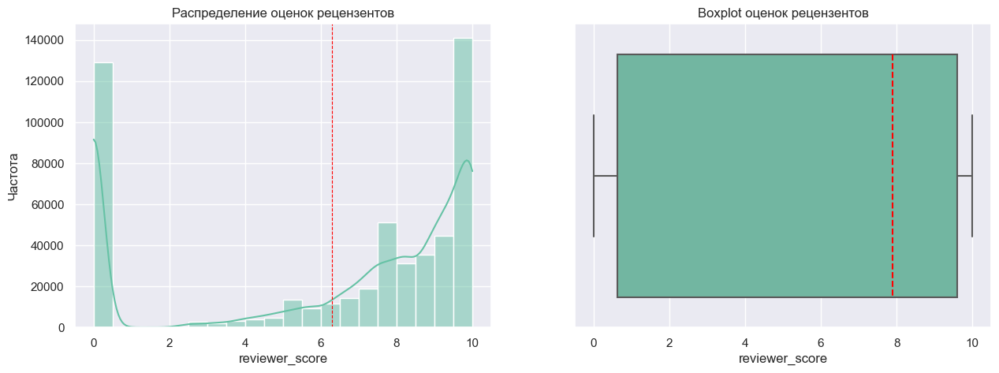

In [68]:
plot_distribution(data, 'reviewer_score', 'оценок рецензентов')

**Вывод** 


Распределение отличается от нормального

## 2.1. hotel_address - адрес отеля

In [69]:
# Cтруктура
data['hotel_address'].sample(5)

111205           Cadogan Place Kensington and Chelsea London SW1X 9PY United Kingdom
496720    54 Upper Berkeley Street Westminster Borough London W1H 7QR United Kingdom
246760        Nieuwezijdskolk 19 Amsterdam City Center 1012 PV Amsterdam Netherlands
331572            De Passage 90 Noord Holland Zuidoost 1101 AX Amsterdam Netherlands
180149            Gran Via de les Corts Catalanes 668 Eixample 08010 Barcelona Spain
Name: hotel_address, dtype: object

In [70]:
# Создаем новые признаки Город и Страна 
data['city'], data['country'] = zip(*data['hotel_address'].apply(extract_city_country))

In [71]:
data.sample(3)

,hotel_address,additional_number_of_scoring,review_date,average_score,hotel_name,reviewer_nationality,negative_review,review_total_negative_word_counts,total_number_of_reviews,positive_review,review_total_positive_word_counts,total_number_of_reviews_reviewer_has_given,reviewer_score,tags,days_since_review,lat,lng,sample,city,country
210693,20 Lavington Street Southwark London SE1 0NZ United Kingdom,804,7/1/2016,9.1,citizenM London Bankside,Australia,No Negative,0,3802,I love the vibe here and the whole philosophy of Citizen M I ve stayed here before and will come back again,24,14,10.0,"[' Business trip ', ' Couple ', ' Double Room ', ' Stayed 5 nights ', ' Submitted from a mobile device ']",398 day,51.505151,-0.100472,1,London,UK
410478,Passeig del Taulat 262 264 Sant Mart 08019 Barcelona Spain,71,8/12/2016,7.9,Hilton Diagonal Mar Barcelona,France,Takes too long to get the rooms clean some times I went out for 3 to 5 hours and find the room still dirt I would suggest them to increase the cleaning staff,34,503,The swimming pool is great,6,9,0.0,"[' Leisure trip ', ' Family with young children ', ' Twin Hilton Guestroom ', ' Stayed 6 nights ']",356 day,41.408433,2.217821,0,Barcelona,Spain
374047,2 Montagu Place Westminster Borough London W1H 2ER United Kingdom,65,10/31/2016,9.1,Montagu Place Hotel,Japan,No lift Far from Tube bus station just next corner,12,287,Cozy comfortable casual small hotel Good shops and restaurants around Very friendly staff,15,9,9.2,"[' Leisure trip ', ' Family with young children ', ' 2 rooms ', ' Stayed 4 nights ', ' Submitted from a mobile device ']",276 day,51.519101,-0.159200,1,London,UK


In [72]:
# Считаем количество уникальных значений и упорядочиваем их по возрастанию
city_count = data['city'].value_counts(ascending=True)
country_count = data['country'].value_counts(ascending=True)

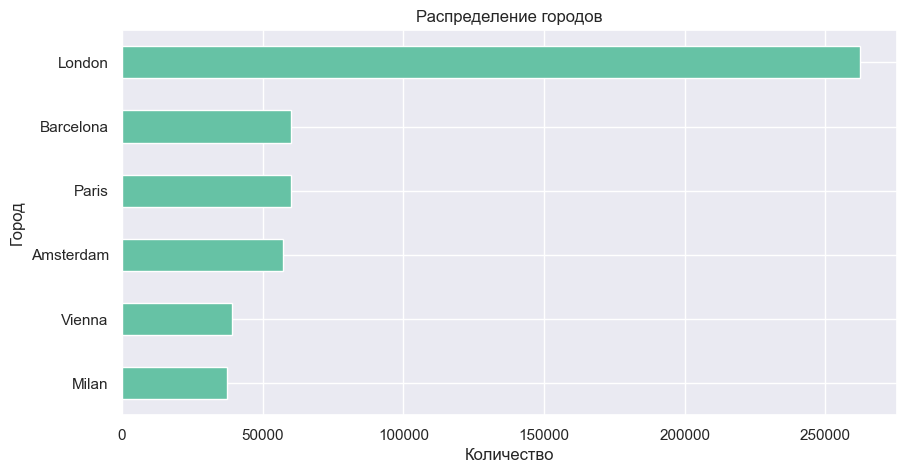

In [73]:
# Создаем график горизонтальной столбчатой диаграммы распределения городов
plt.figure(figsize=(10, 5))

# Строим столбчатую диаграмму на основе данных city_count
city_count.plot(kind='barh')

# Добавляем подписи к графику
plt.title('Распределение городов')
plt.xlabel('Количество')
plt.ylabel('Город')
plt.show()


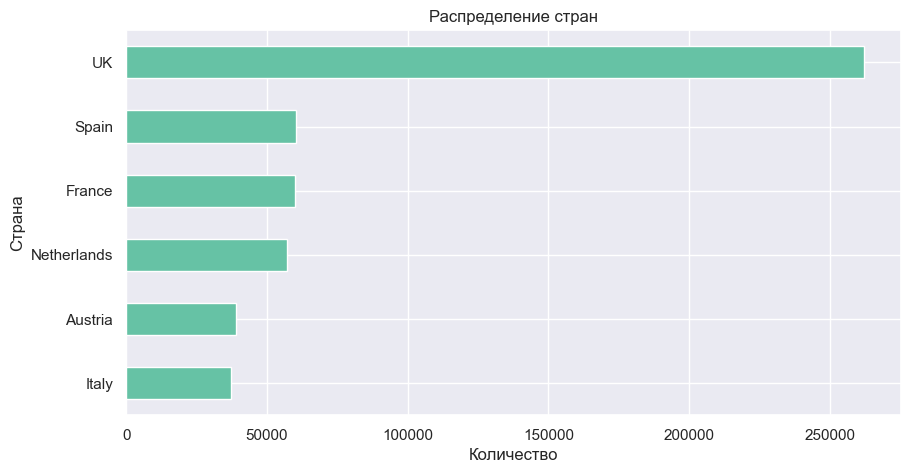

In [74]:
# Создаем график горизонтальной столбчатой диаграммы распределения стран
plt.figure(figsize=(10, 5))

# Строим столбчатую диаграмму на основе данных country_count
country_count.plot(kind='barh')

# Добавляем подписи к графику
plt.title('Распределение стран')
plt.xlabel('Количество')
plt.ylabel('Страна')
plt.show()


**Вывод**

Похоже признаки 'city' и 'country' дублируют друг друга и можно будет оставить один. Большая часть отелей располагается в Лодноне. 

In [75]:
# На kaggle pd.get_dummies зполняет не 0 и 1, а False и True 
# data = pd.get_dummies(data, columns=['city', 'country',], dummy_na=False)


In [76]:
# Применяем OneHotEncoder к столбцам 'city' и 'country' с использованием оригинальных категориальных имен
# Без 'country' MAPE улучшилось
encoder = ce.OneHotEncoder(cols=['city'], use_cat_names=True)

# Преобразуем данные, создавая бинарные (one-hot) кодировки для указанных столбцов
type_bin = encoder.fit_transform(data[['city']])

# Объединяем исходные данные с новыми бинарными кодировками
data = pd.concat([data, type_bin], axis=1)

In [77]:
data.head(1)

,hotel_address,additional_number_of_scoring,review_date,average_score,hotel_name,reviewer_nationality,negative_review,review_total_negative_word_counts,total_number_of_reviews,positive_review,review_total_positive_word_counts,total_number_of_reviews_reviewer_has_given,reviewer_score,tags,days_since_review,lat,lng,sample,city,country,city_London,city_Paris,city_Amsterdam,city_Milan,city_Vienna,city_Barcelona
0,Stratton Street Mayfair Westminster Borough London W1J 8LT United Kingdom,581,2/19/2016,8.4,The May Fair Hotel,United Kingdom,Leaving,3,1994,Staff were amazing,4,7,10.0,"[' Leisure trip ', ' Couple ', ' Studio Suite ', ' Stayed 2 nights ', ' Submitted from a mobile device ']",531 day,51.507894,-0.143671,1,London,UK,1,0,0,0,0,0


In [78]:
# Список городов
# city_list = data['city'].value_counts().index

from geopy.geocoders import Nominatim

def find_coordinates(city_list):
    """
    Находит координаты городов из списка.

    :param city_list: Список городов, для которых нужно найти координаты.
    :type city_list: list[str]
    
    :return: Список словарей, где ключи - названия городов, значения - кортежи с координатами (широта, долгота).
    :rtype: list[dict]
    """
    # Создаем объект геокодера
    geolocator = Nominatim(user_agent="city_coordinates_finder")

    # Инициализируем пустой список для хранения результатов
    coordinates_list = []

    # Итерируемся по списку городов и находим координаты для каждого
    for city in city_list:
        location = geolocator.geocode(city)

        # Проверяем, найдены ли координаты для города
        if location is not None:
            coordinates = (location.latitude, location.longitude)
            coordinates_dict = {city: coordinates}
            coordinates_list.append(coordinates_dict)
        else:
            coordinates_dict = {city: "Координаты не найдены"}
            coordinates_list.append(coordinates_dict)

    return coordinates_list

city_coordinates = find_coordinates(city_list)
print(city_coordinates)


In [79]:
# Добавим признак distance - расстояние от центра  города расположения отеля 
# до отеля, используя координаты отеля и координаты центра города

In [80]:
# Добавим distance в основной датасет

#### Ухудшает MAPE. Признак исключен.

## 2.2. additional_number_of_scoring - количество оценок без проверки

Есть также некоторые гости, которые просто поставили оценку сервису, а не оставили отзыв.

Это число указывает, сколько там действительных оценок без проверки

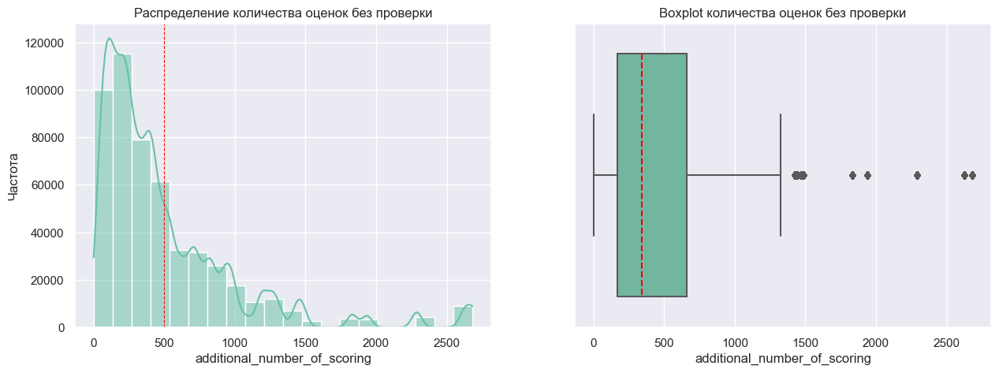

In [81]:
plot_distribution(data, 'additional_number_of_scoring', 'количества оценок без проверки')

**Вывод** 


Распределение отличается от нормального. Есть выбросы

## 2.3. review_date - дата, когда рецензент разместил соответствующий отзыв

In [82]:
# Преобразуем признак 'review_date' в формат даты
data['review_date'] = pd.to_datetime(data['review_date'], format = '%m/%d/%Y')

data['review_date'].value_counts()

In [83]:
# data['review_date'].describe(datetime_is_numeric=True)

In [84]:
# Создадим новые признаки
data['year'] = data['review_date'].dt.year
data['month'] = data['review_date'].dt.month
data['day'] = data['review_date'].dt.day
# преобразуем, чтобы неделя начиналась не с 0, а с 1
data['weekday'] = data['review_date'].dt.weekday+1

# Графики распределения количества отзывов (по годам, месяцам, дням)

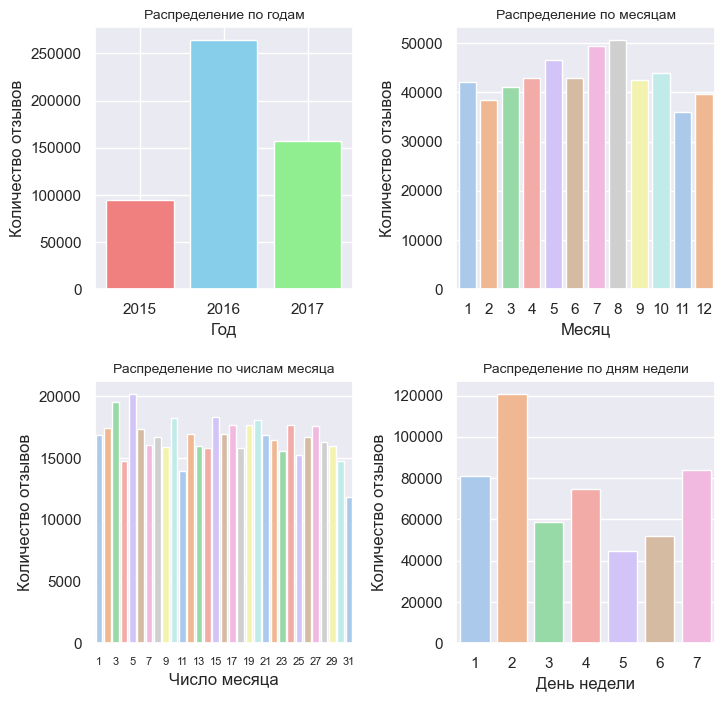

In [85]:
# Создание сетки для графиков
fig, axes = plt.subplots(nrows=2, ncols=2, figsize=(8, 8))
plt.subplots_adjust(hspace=.35, wspace=.4)

# График 1: Распределение по годам
hist_values = data['year'].value_counts()
histplot1 = axes[0, 0].bar(hist_values.index, hist_values, color=['skyblue', 'lightgreen', 'lightcoral'])
axes[0, 0].set_title('Распределение по годам', fontsize=10)
axes[0, 0].set_xlabel('Год')
axes[0, 0].set_ylabel('Количество отзывов')

# График 2: Распределение по месяцам
countplot2 = sns.countplot(data=data, x='month', ax=axes[0, 1], palette='pastel')
countplot2.set_title('Распределение по месяцам', fontsize=10)
countplot2.set_xlabel('Месяц')
countplot2.set_ylabel('Количество отзывов')

# График 3: Распределение по числам месяца
countplot3 = sns.countplot(data=data, x='day', ax=axes[1, 0], palette='pastel')
countplot3.set_title('Распределение по числам месяца', fontsize=10)
countplot3.set_xlabel('Число месяца')
countplot3.set_ylabel('Количество отзывов')
countplot3.set_xticks(countplot3.get_xticks()[::2])  # Отображение каждого пятого числа месяца
countplot3.tick_params(axis='x', labelrotation=0, labelsize=8)  # Улучшение читаемости чисел месяца

# График 4: Распределение по дням недели
countplot4 = sns.countplot(data=data, x='weekday', ax=axes[1, 1], palette='pastel')
countplot4.set_title('Распределение по дням недели', fontsize=10)
countplot4.set_xlabel('День недели')
countplot4.set_ylabel('Количество отзывов')

# Отображение графиков
plt.show()


**Вывод**

- Количество отзывов зависит от года. Наибольшее количество отзывов в 2016 году. 
- Количество отзывов зависит от месяца. Наибольшее количество отзывов в летнии месяцы. 
- Количество отзывов зависит от дня месяца. 
- Количество отзывов зависит от дня недели. 

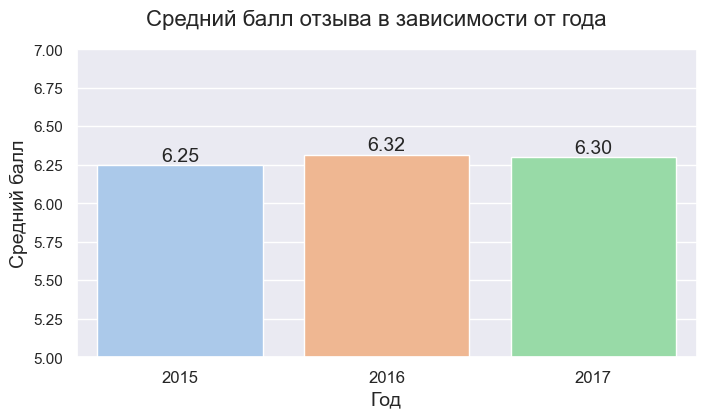

In [86]:
chart_score_column(data, 'year',
                   'Средний балл отзыва в зависимости от года',
                   'Год',
                   'Средний балл',
                   size=[8, 4], ylim=[5, 7])

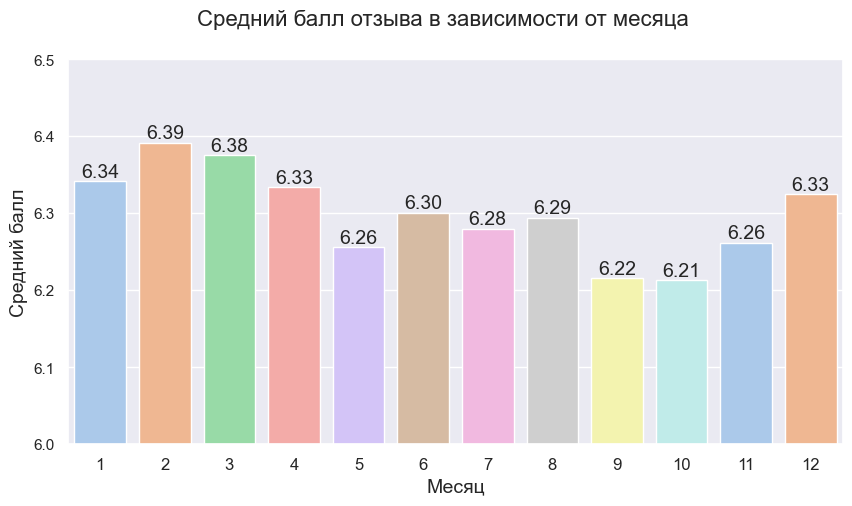

In [87]:
chart_score_column(data, 'month',
                   'Средний балл отзыва в зависимости от месяца',
                   'Месяц',
                   'Средний балл',
                   size=[10, 5], ylim=[6, 6.5])

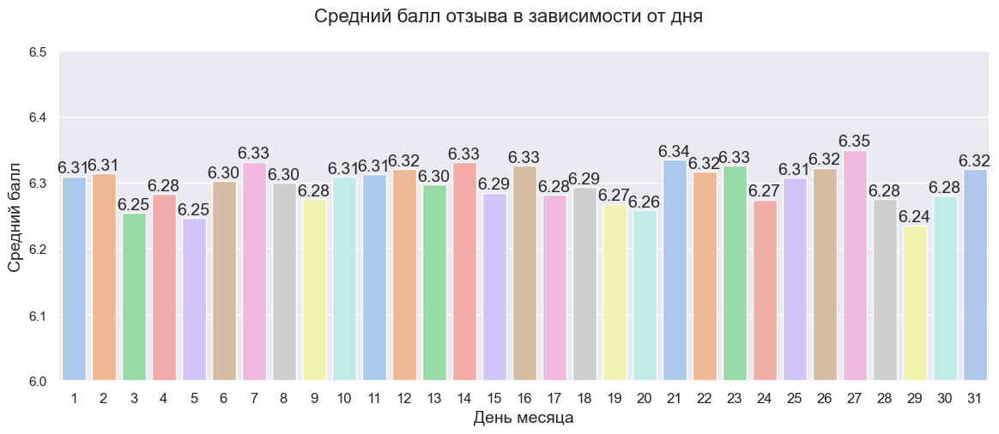

In [88]:
chart_score_column(data, 'day',
                   'Средний балл отзыва в зависимости от дня',
                   'День месяца',
                   'Средний балл',
                   size=[14, 5], ylim=[6, 6.5])

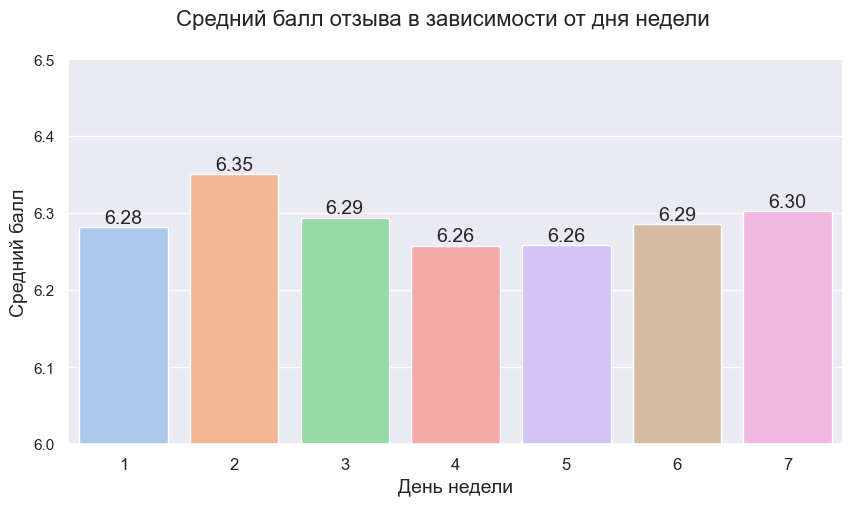

In [89]:
chart_score_column(data, 'weekday',
                   'Средний балл отзыва в зависимости от дня недели',
                   'День недели',
                   'Средний балл',
                   size=[10, 5], ylim=[6, 6.5])

## 2.4. average_score - средний балл отеля

рассчитанный на основе последнего комментария за последний год

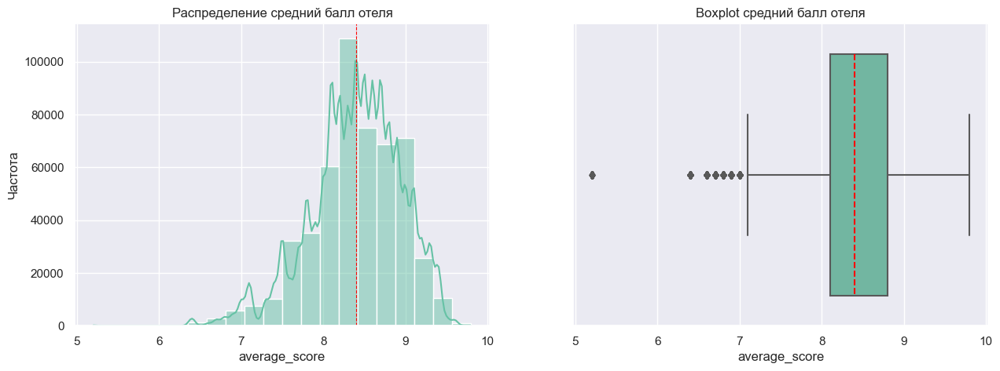

In [90]:
plot_distribution(data, 'average_score', 'средний балл отеля')

In [91]:
# Проводим тесты Шапиро-Уилка
print('\n средний балл отеля:')
result = stats.shapiro(data['average_score'])
decision_normality(result[1])


 средний балл отеля:
p-value = 0.000
p-значение меньше, чем заданный уровень значимости 0.05. Распределение отлично от нормального


C:\Users\Usr\anaconda3\lib\site-packages\scipy\stats\morestats.py:1760: UserWarning: p-value may not be accurate for N > 5000.
  warnings.warn("p-value may not be accurate for N > 5000.")


#### Нормализация

In [92]:
if normalize:
    data = normalize_and_plot(data, 'average_score',
                          'norm_average_score', 'средний балл отеля')

## 2.5. hotel_name - название отеля

In [93]:
# data['hotel_name'].value_counts().head(50)

In [94]:
chain_brands = ['Premier Inn', 'Travelodge', 'Holiday Inn', 'Hilton', 'Britannia hotels', 'DoubleTree', 'Ibis',
                'Best Western', 'Marriott', 'Hyatt', 'Meliá', 'Sol', 'H10', 'Barceló', 'NH', 'Bes', 'Eurostars',
                'Riu', 'Iberostar', 'AC by Marriot', 'B&B', 'Campanile', 'Hotelf1', 'Première Classe', 'Novotel',
                'Kyriad', 'Van der Valk',  'Fletcher', 'Bastion', 'Bilderberg', 'Golden Tulip', 'The Student Hotel',
                'Radisson', 'Apollo', 'TH Resorts', 'Bluserena', 'Mercure', 'Unahotels', 'Blu Hotels', 'Aeroviaggi',
                'Iti Hotels-Marina H&R', 'Sheraton', 'Aldemar', 'InterContinental', 'Park Hotels & Resorts', 'Domina',
                'Four Seasons', 'Iberostar Hotels', 'Ibis Hotel', 'Le Meridien', 'Rixos', 'Ritz Carlton']

In [95]:
# Применение функции к признаку 'hotel_name' и создание нового бинарного признака 'chains_hotels'
data['chains_hotels'] = data['hotel_name'].apply(lambda x: is_chain_hotel(x, chain_brands))


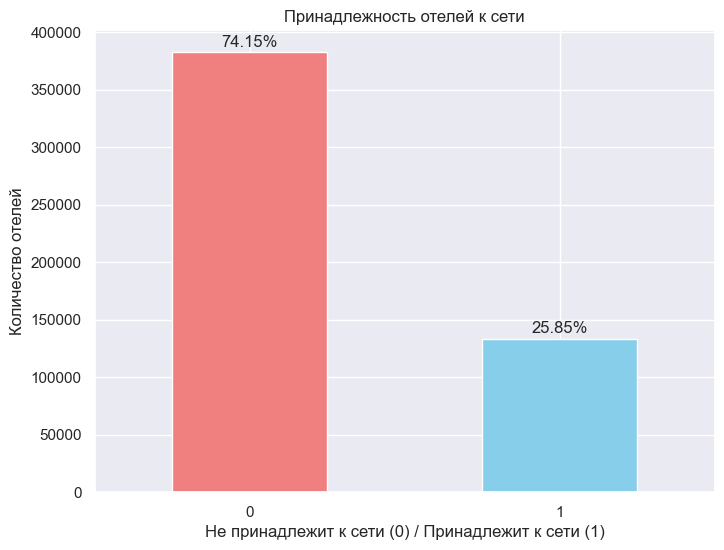

In [96]:
# Расчет процентного соотношения
percentage_values = data['chains_hotels'].value_counts(normalize=True) * 100

# Создание объекта графика с указанием размера
fig, ax = plt.subplots(figsize=(8, 6))

# Визуализация данных о принадлежности отелей к сети с процентным соотношением
data['chains_hotels'].value_counts().plot(
    kind='bar', color=['lightcoral', 'skyblue'], ax=ax)
ax.set_title('Принадлежность отелей к сети')
ax.set_xlabel('Не принадлежит к сети (0) / Принадлежит к сети (1)')
ax.set_ylabel('Количество отелей')

# Добавление процентного соотношения над столбцами
for i, value in enumerate(percentage_values):
    plt.text(i, data['chains_hotels'].value_counts()[
             i] + 5000, f'{value:.2f}%', ha='center')

plt.xticks(rotation=0)
plt.show()

**Вывод**

Четверь отелей принадлежит к какой либо сети


## 2.6. reviewer_nationality  - национальность рецензента

Частота встречаемости рецензентов по национальностям:

 - Сколько различных значений имеется в столбце Reviewer_Nationality и какие они?
 - Какая национальность рецензента встречается чаще всего в наборе данных (страна печати и количество рецензий)?
 - Какие следующие 10 наиболее часто встречающихся национальностей и их частота?

In [97]:
# Вычисление частоты национальностей среди рецензентов
nationality_freq = data["reviewer_nationality"].value_counts()

# Вывод общего количества различных национальностей
print("Всего " + str(nationality_freq.size) + " различных национальностей")

# Вывод частоты каждой национальности
print(nationality_freq)


Всего 227 различных национальностей
 United Kingdom               245246
 United States of America      35437
 Australia                     21686
 Ireland                       14827
 United Arab Emirates          10235
                               ...  
 Guinea                            1
 Tuvalu                            1
 Comoros                           1
 Anguilla                          1
 Cape Verde                        1
Name: reviewer_nationality, Length: 227, dtype: int64


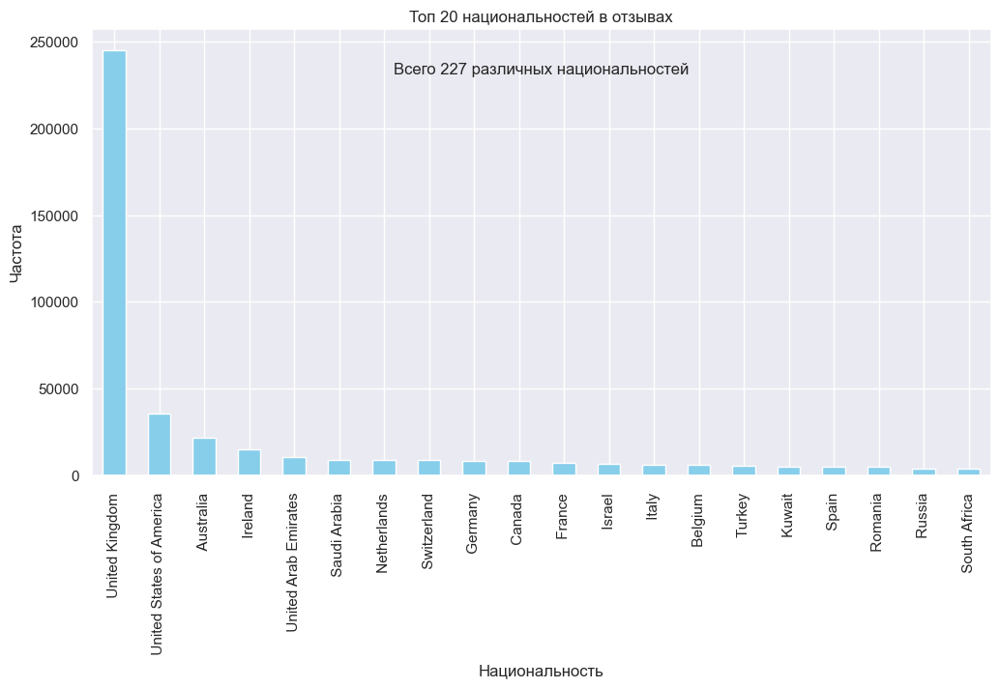

In [98]:
top_vs_n = 20
top_nationalities = nationality_freq.head(top_vs_n)

# Визуализация топ N национальностей с помощью столбчатой диаграммы
top_nationalities.plot(kind='bar', figsize=(12, 6), color='skyblue')
plt.title(f'Топ {top_vs_n} национальностей в отзывах')
plt.xlabel('Национальность')
plt.ylabel('Частота')

# Добавление текста к графику для отображения общего числа различных национальностей
plt.text(0.5, 0.9, f"Всего {nationality_freq.size} различных национальностей", transform=plt.gca().transAxes, ha='center')

plt.show()

In [99]:
print("Самая часто встречающаяся национальность рецензентов - " + str(nationality_freq.index[0]).strip() + " с " + str(nationality_freq[0]) + " отзывами.")
# Обратите внимание, что у значений есть ведущий пробел, strip() удаляет его при выводе
# Какие 100 национальностей самые распространенные, и каковы их частоты?
print("Следующие 19 наиболее частых национальностей рецензентов:")
print(nationality_freq[1:19].to_string())


Самая часто встречающаяся национальность рецензентов - United Kingdom с 245246 отзывами.
Следующие 19 наиболее частых национальностей рецензентов:
 United States of America     35437
 Australia                    21686
 Ireland                      14827
 United Arab Emirates         10235
 Saudi Arabia                  8951
 Netherlands                   8772
 Switzerland                   8678
 Germany                       7941
 Canada                        7894
 France                        7296
 Israel                        6610
 Italy                         6114
 Belgium                       6031
 Turkey                        5444
 Kuwait                        4920
 Spain                         4737
 Romania                       4552
 Russia                        3900


**Выводы**
1. Общее количество национальностей: Всего в данных представлены отзывы от рецензентов из 227 различных национальностей.

2. Топ национальностей: Самые часто встречающиеся национальности включают United Kingdom (Великобритания), United States of America (США), Australia (Австралия), Ireland (Ирландия), United Arab Emirates (Объединенные Арабские Эмираты) и другие.

3. Разнообразие участников: Данные отражают широкий спектр национальностей, что может быть важной информацией для понимания международного влияния и разнообразия аудитории в отзывах.

4. Доли редких национальностей: Есть некоторые национальности, представленные всего одним отзывом. Это может указывать на небольшое количество рецензентов из этих стран.

In [100]:
# TOP_N  Выбрал по MAPE
top_nationalities = nationality_freq.head(TOP_N)

# Применим функцию с использованием apply к признаку "reviewer_nationality"
data['top_reviewer_nationality'] = data['reviewer_nationality'].apply(
    lambda x: process_nationality(x, top_nationalities))

In [101]:
data['top_reviewer_nationality'].value_counts()

 United Kingdom               245246
other                          92646
 United States of America      35437
 Australia                     21686
 Ireland                       14827
 United Arab Emirates          10235
 Saudi Arabia                   8951
 Netherlands                    8772
 Switzerland                    8678
 Germany                        7941
 Canada                         7894
 France                         7296
 Israel                         6610
 Italy                          6114
 Belgium                        6031
 Turkey                         5444
 Kuwait                         4920
 Spain                          4737
 Romania                        4552
 Russia                         3900
 South Africa                   3821
Name: top_reviewer_nationality, dtype: int64

#### Кодирование национальностей

In [102]:
if nationality_encoding:
    # Закодируем новый признак с использованием OneHotEncoder
    encoder = ce.OneHotEncoder(
        cols=['top_reviewer_nationality'], use_cat_names=True)
    type_bin_nat = encoder.fit_transform(data[['top_reviewer_nationality']])
    data = pd.concat([data, type_bin_nat], axis=1)

## 2.7. negative_review - отрицательный отзыв, который рецензент дал отелю

In [103]:
not_all_negative = data['negative_review'].value_counts().head(100).index.tolist()
# not_all_negative

In [104]:
# Анализ тональности каждого слова и выбор слов, которые не негативные

not_negative_words_tb = [word for word in not_all_negative if TextBlob(word).sentiment.polarity >= 0]
print(not_negative_words_tb)

['No Negative', ' Nothing', ' Nothing ', ' nothing', ' N A', ' None', ' ', ' N a', ' Breakfast', ' Location', ' Everything', ' All good', ' Nothing really', ' none', ' nothing ', ' No complaints', ' Price', ' Nothing really ', ' Nil', ' n a', ' Nothing at all', ' Nothing to dislike', ' Nothing at all ', ' None ', ' No complaints ', ' All good ', ' NA', ' Room size', ' Can t think of anything ', ' Staff', ' Absolutely nothing ', ' No', ' Everything was perfect', ' Nothing to dislike ', ' Everything was perfect ', ' Everything was great ', ' Leaving', ' Nothing to complain about ', ' Leaving ', ' NOTHING', ' Having to leave ', ' Na', ' See above', ' Nothing not to like', ' Can t think of anything', ' Liked everything', ' breakfast', ' Non', ' Everything was great', ' Absolutely nothing', ' I liked everything', ' Parking', ' Pillows', ' Not applicable', ' Everything was good', ' Nothing not to like ', ' Nothing all good', ' Size of room', ' location', ' Wifi', ' All was good', ' The price

## 2.8. positive_review - положительный отзыв, который рецензент дал отелю

In [105]:
not_all_positive = data['positive_review'].value_counts().head(100).index.tolist()
# not_all_positive

In [106]:
# Анализ тональности каждого слова и выбор слов, которые не позитивные

not_positive_words_tb = [word for word in not_all_positive if TextBlob(word).sentiment.polarity <= 0]
print(not_positive_words_tb)

['No Positive', ' Location', ' Everything', ' location', ' Nothing', ' The location', ' Location ', ' Everything ', ' Breakfast', ' Staff', ' Location and staff', ' everything', ' Nothing ', ' Comfy bed', ' nothing', ' The location ', ' The staff', ' ', ' the location', ' Location staff', ' All', ' Every thing', ' Cleanliness', ' Location location location', ' breakfast', ' Position', ' Helpful staff', ' Staff and location', ' Central location', ' Location Staff', ' The bed', ' Location only', ' The room', ' Not much', ' Room', ' Location and breakfast', ' Convenient location', ' The breakfast', ' Service', ' The view', ' Location location location ', ' Location and cleanliness', ' Bed', ' location staff', ' The bed was comfy']


In [107]:
neutral_negative = [word for word in not_all_negative if TextBlob(word).sentiment.polarity == 0]
print(neutral_negative)

[' Nothing', ' Nothing ', ' nothing', ' N A', ' None', ' ', ' N a', ' Breakfast', ' Location', ' Everything', ' none', ' nothing ', ' No complaints', ' Price', ' Nil', ' n a', ' Nothing at all', ' Nothing to dislike', ' Nothing at all ', ' None ', ' No complaints ', ' NA', ' Room size', ' Can t think of anything ', ' Staff', ' No', ' Nothing to dislike ', ' Leaving', ' Nothing to complain about ', ' Leaving ', ' NOTHING', ' Having to leave ', ' Na', ' See above', ' Nothing not to like', ' Can t think of anything', ' breakfast', ' Non', ' Parking', ' Pillows', ' Not applicable', ' Nothing not to like ', ' Size of room', ' location', ' Wifi', ' The price', ' Size of the room', ' No parking', ' Breakfast not included', ' Nothing to complain about', ' As above', ' Noise', ' No thing', ' Bathroom', ' The breakfast', ' Bed', ' No gym', ' Price of breakfast', ' Room']


In [108]:
neutral_positive = [word for word in not_all_positive if TextBlob(word).sentiment.polarity == 0]
print(neutral_positive)

[' Location', ' Everything', ' location', ' Nothing', ' The location', ' Location ', ' Everything ', ' Breakfast', ' Staff', ' Location and staff', ' everything', ' Nothing ', ' Comfy bed', ' nothing', ' The location ', ' The staff', ' ', ' the location', ' Location staff', ' All', ' Every thing', ' Cleanliness', ' Location location location', ' breakfast', ' Position', ' Helpful staff', ' Staff and location', ' Central location', ' Location Staff', ' The bed', ' Location only', ' The room', ' Room', ' Location and breakfast', ' Convenient location', ' The breakfast', ' Service', ' The view', ' Location location location ', ' Location and cleanliness', ' Bed', ' location staff', ' The bed was comfy']


#### Генерация новых признаков 'not_negative', 'not_positive' 
значение 1 для признака, если содержит фразу из соответствующих списков: 
not_negative_words, not_positive_words.

In [109]:
# Инициализируем новые признаки нулями
data['not_negative'], data['not_positive'] = 0, 0

# Задаем список фраз, указывающих на отсутствие негативного отзыва


not_negative_words = ['no negative', 'nothing', 'n a', 'none', '',  'all good',
                      'nothing really', 'none', 'no complaints', 'nil',
                      'nothing at all', 'nothing to dislike', 'nothing at all', 'none', 'no complaints',
                      'na', 'can t think of anything', 'absolutely nothing', 'no',
                      'everything was perfect', 'nothing to dislike', 'everything was perfect',
                      'everything was great', 'nothing to complain about', 'nothing', 'having to leave',
                      'na', 'nothing not to like', 'can t think of anything', 'liked everything',
                      'non', 'everything was great', 'absolutely nothing', 'i liked everything', 'everything was good',
                      'nothing all good', 'all was good', 'nothing to complain about', 'i liked everything',
                      'nothing really', 'everything was good', 'all good', 'everything was fine']


# Устанавливаем значение 1 для признака 'not_negative' для строк,
# где признак 'negative_review' содержит фразу из not_negative_words
data.loc[data['negative_review'].str.lower().str.strip().isin(
    not_negative_words), 'not_negative'] = 1

# Устанавливаем значение 1 для признака 'not_positive',
# где признак 'negative_review' содержит фразу 'everything'
data.loc[data['negative_review'].str.lower().str.strip().isin(
    ['everything']), 'not_positive'] = 1

# Удаляем фразы из признака 'negative_review', которые присутствуют
# в списке not_negative_words
data.loc[data['negative_review'].str.lower().str.strip().isin(
    not_negative_words), 'negative_review'] = ''

# Выводим топ самых часто встречающихся значений в столбце 'negative_review'
top_negative_reviews = data['negative_review'].value_counts()[:10]
top_negative_reviews

                159167
 Breakfast         407
 Small room        373
 Location          368
 Everything        326
 Price             260
 Small rooms       188
 Expensive         142
 Room size         140
 Staff             130
Name: negative_review, dtype: int64

In [110]:
# Задаем список фраз, указывающих на отсутствие положительного отзыва
# not_positive_words = ['no positive',  'nothing', 'location only', 'not much']

not_positive_words = ['nothing', 'not much']

# Устанавливаем значение 1 для признака 'not_positive' для строк, 
# где признак 'positive_review' содержит фразу из списка not_positive_words
data.loc[data['positive_review'].str.lower().str.strip().isin(
    not_positive_words), 'not_positive'] = 1

# Устанавливаем значение 1 для признака 'not_negative' для строк, 
# в которых столбец 'positive_review' содержит фразу 'everything'
data.loc[data['positive_review'].str.lower(
).str.strip().isin(['everything']), 'not_negative'] = 1

# Выводим топ самых часто встречающихся значений в столбце 'positive_review'
top_positive_reviews = data['positive_review'].value_counts()[:10]
top_positive_reviews

No Positive        35946
 Location           9222
 Everything         2284
 location           1677
 Nothing            1243
 The location       1126
 Great location     1047
 Good location       927
 Location            915
 Everything          613
Name: positive_review, dtype: int64

#### Генерация новых признаков : 'neg_rev_len', pos_rev_len'

In [111]:
# Создаем новый признак - длина каждого отзыва в признаке 'negative_review'
data['neg_rev_len'] = data['negative_review'].apply(len)

# Создаем новый признак - длина каждого отзыва в признаке 'positive_review'
data['pos_rev_len'] = data['positive_review'].apply(len)

#### Кодирование с помощью лексикона Afinn и создание нового признака - 'afinn_score'

In [112]:
# Временный новый признак - объединяем отзывы
data['review'] = data['positive_review'] + ' ' + data['negative_review']

In [113]:
if afinn_encoding:
    # В лексиконе AFINN для анализа сентимента словам присваивается оценка от -5 до 5,
    # при этом отрицательные оценки указывают на негативное настроение,
    # а положительные оценки указывают на положительное настроение.

    # Cоздаем экземпляр класса Afinn
    afinn = Afinn()

    # Применяем метод score этого экземпляра к столбцу review в датафрейме
    # чтобы вычислить оценку сентимента для каждого отзыва.

    #  Создаем новый признак afinn_score, в котором сохраняем результат оценки
    data['afinn_score'] = data['review'].apply(lambda x: afinn.score(x))

#### Генерация новых признаков  с помощью sia_two_features 

In [114]:
if sia_two_features_encoding:
    # Cоздаем новые признаки negative_sentiment и positive_sentiment
    # на основе отрицательных и положительных отзывов соответственно.

    # Создание экземпляра SentimentIntensityAnalyzer
    sia_two_features = SentimentIntensityAnalyzer()

    # Определение функции для вычисления сентимента

    def calculate_sentiment(text):
        tokens = word_tokenize(text)
        sentiment_scores = [sia_two_features.polarity_scores(
            word)['compound'] for word in tokens]
        return sum(sentiment_scores)


    # Создание новых признаков
    data['negative_sentiment'] = data['negative_review'].apply(calculate_sentiment)
    data['positive_sentiment'] = data['positive_review'].apply(calculate_sentiment)

In [115]:
# data['negative_sentiment'][:10]

In [116]:
# data['positive_sentiment'][:10]

#### Генерация новых признаков  с помощью sia_four_features  

In [117]:
if sia_four_features_encoding:
    # Создание экземпляра SentimentIntensityAnalyzer sia_four_features
    sia_four_features = SentimentIntensityAnalyzer()

    # Применение анализа тональности к отрицательным отзывам и запись результатов в новый признак
    data['sent_negative_review'] = data['negative_review'].apply(
        lambda x: sia_four_features.polarity_scores(x))
    # Применение анализа тональности к положительным отзывам и запись результатов в новый признак
    data['sent_positive_review'] = data['positive_review'].apply(
        lambda x: sia_four_features.polarity_scores(x))

    # Расширение датафрейма новыми признаками на основе результатов анализа отрицательных отзывов
    data.loc[:, ['neg_neg', 'neg_neu', 'neg_pos', 'neg_compound']] = list(
        data['sent_negative_review'].apply(lambda x: [x['neg'], x['neu'], x['pos'], x['compound']]).values)

    # Расширение датафрейма новыми признаками на основе результатов анализа положительных отзывов
    data.loc[:, ['pos_neg', 'pos_neu', 'pos_pos', 'pos_compound']] = list(
        data['sent_positive_review'].apply(lambda x: [x['neg'], x['neu'], x['pos'], x['compound']]).values)

#### Генерация новых признаков  с помощью  sia_combined_features_encoding

In [118]:
if sia_combined_features_encoding:
    # Создание экземпляра SentimentIntensityAnalyzer sia_combined_features
    sia_combined_features = SentimentIntensityAnalyzer()

    # Применение анализа тональности к отрицательным отзывам и запись результатов в новый признак
    data['sent_negative_review'] = data['negative_review'].apply(
        lambda x: sia_combined_features.polarity_scores(x))
    # Применение анализа тональности к положительным отзывам и запись результатов в новый признак
    data['sent_positive_review'] = data['positive_review'].apply(
        lambda x: sia_combined_features.polarity_scores(x))

    # Расширение датафрейма новыми признаками на основе результатов анализа отрицательных отзывов
    data.loc[:, ['neg_neg', 'neg_neu', 'neg_pos', 'neg_compound']] = list(
        data['sent_negative_review'].apply(lambda x: [x['neg'], x['neu'], x['pos'], x['compound']]).values)

    # Расширение датафрейма новыми признаками на основе результатов анализа положительных отзывов
    data.loc[:, ['pos_neg', 'pos_neu', 'pos_pos', 'pos_compound']] = list(
        data['sent_positive_review'].apply(lambda x: [x['neg'], x['neu'], x['pos'], x['compound']]).values)

    # Интеграция создания новых признаков через лямбда функции
    data['negative_sentiment'] = data['negative_review'].apply(
        lambda text: sum([sia_combined_features.polarity_scores(word)['compound'] for word in word_tokenize(text)]))
    data['positive_sentiment'] = data['positive_review'].apply(
        lambda text: sum([sia_combined_features.polarity_scores(word)['compound'] for word in word_tokenize(text)]))

    # Создаем признак neg_emotional_intensity
    data['neg_emotional_intensity'] = data['negative_sentiment'] / data['neg_rev_len']

    # Создаем признак pos_emotional_intensity
    data['pos_emotional_intensity'] = data['positive_sentiment'] / data['pos_rev_len']

    # Создаем признак sentiment_overlap
    data['sentiment_overlap'] = data['positive_sentiment'] - data['negative_sentiment']

    # Бинаризация признака sentiment_overlap
    data['sentiment_overlap_encoded'] = (data['sentiment_overlap'] > 0).astype(int)
    data.drop('sentiment_overlap', axis=1, inplace=True) # MAPE: 0.1209591422183487

## 2.9. review_total_negative_word_counts - общее количество слов в отрицательном отзыве

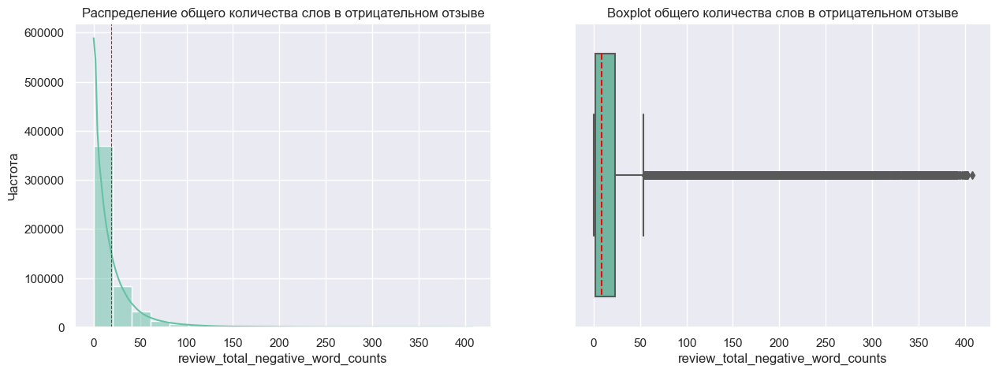

In [119]:
plot_distribution(data, 'review_total_negative_word_counts', 'общего количества слов в отрицательном отзыве')

**Вывод** 


Распределение отличается от нормального. Много выбросов.

#### Нормализация

In [120]:
if normalize:
    data = normalize_and_plot(data, 'review_total_negative_word_counts',
                          'norm_review_total_negative_word_counts', 'общего количества слов в отрицательном отзыве')

## 2.10.  review_total_positive_word_counts - общее количество слов в положительном отзыве

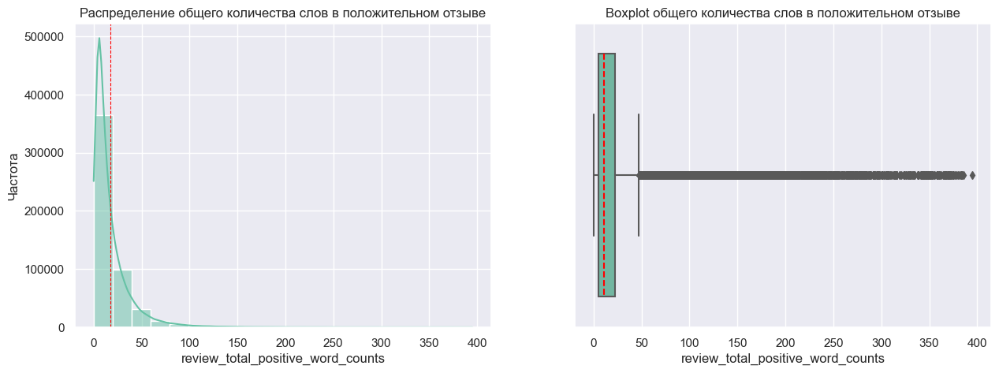

In [121]:
plot_distribution(data, 'review_total_positive_word_counts', 'общего количества слов в положительном отзыве')

**Вывод** 


Распределение отличается от нормального. Много выбросов.

#### Нормализация

In [122]:
if normalize:
    data = normalize_and_plot(data, 'review_total_positive_word_counts',
                          'norm_review_total_positive_word_counts', 'общего количества слов в положительном отзыве')

## 2.11. total_number_of_reviews - общее количество действительных отзывов об отеле

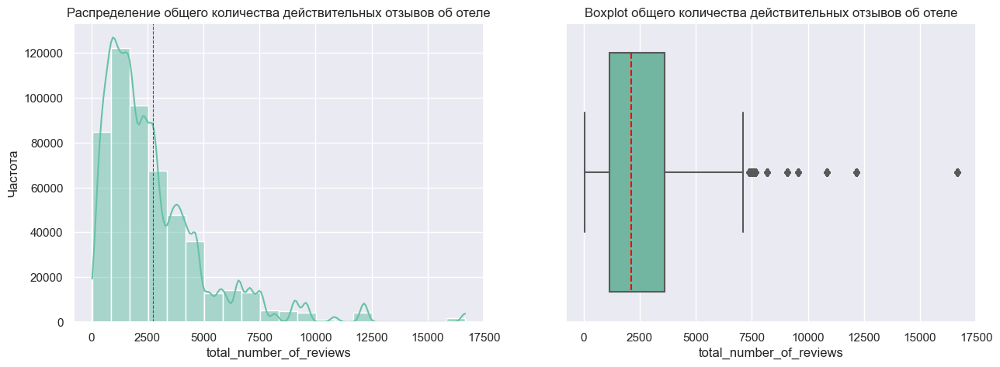

In [123]:
plot_distribution(data, 'total_number_of_reviews', 'общего количества действительных отзывов об отеле')

**Вывод** 


Распределение отличается от нормального. Есть выбросы

#### Общее количество слов в отзывах

In [124]:
# Рассчитываем общее количество слов в отзывах.
data['review_total_word_counts'] = data['review_total_negative_word_counts'] + data['review_total_positive_word_counts']

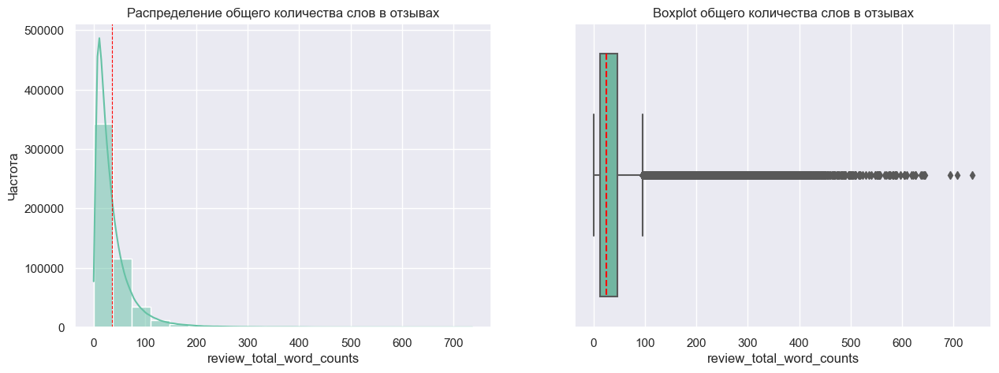

In [125]:
plot_distribution(data, 'review_total_word_counts', 'общего количества слов в отзывах')

**Вывод** 


Распределение отличается от нормального. Много выбросов.

#### Нормализация

In [126]:
if normalize: 
    data = normalize_and_plot(data, 'review_total_word_counts',
                          'norm_review_total_word_counts', 'общего количества слов в отзывах')
    

#### Генерация новых признаков : 'neg_review_length_ratio' и 'pos_review_length_ratio' 

In [127]:
if review_length_ratio: 
    # Заменяем 0 на 1, чтобы избежать деления на 0
    data['review_total_word_counts'].replace(0, 1, inplace=True)

    # Отношение длины отрицательного отзыва к общему числу слов в отзыве.
    data['neg_review_length_ratio'] = data['neg_rev_len'] / data['review_total_word_counts']

    # Отношение длины положительного отзыва к общему числу слов в отзыве.
    data['pos_review_length_ratio'] = data['pos_rev_len'] / data['review_total_word_counts']

    # Заменяем бесконечные значения на NaN и затем на медиану
    data.replace([np.inf, -np.inf], np.nan, inplace=True)
    data.fillna(data.median(numeric_only=True), inplace=True)

#### Генерация новых признаков : 'neg_word_density_ratio' и 'pos_word_density_ratio'

Они показывают, насколько плотно наполнен отзыв относительно его длины для отрицательных и положительных отзывов соответственно.

#### Генерация новых признаков: 'negative_words_ratio' и 'positive_words_ratio'

In [128]:
if words_ratio: 
    # Заменяем 0 на 1, чтобы избежать деления на 0
    data['review_total_word_counts'].replace(0, 1, inplace=True)

    # Рассчитываем долю отрицательных слов от общего числа слов в отзывах
    data['negative_words_ratio'] = data['review_total_negative_word_counts'] / data['review_total_word_counts']

    # Рассчитываем долю положительных слов от общего числа слов в отзывах
    data['positive_words_ratio'] = data['review_total_positive_word_counts'] / data['review_total_word_counts']

    # Заменяем бесконечные значения на NaN и затем на медиану
    data.replace([np.inf, -np.inf], np.nan, inplace=True)
    data.fillna(data.median(numeric_only=True), inplace=True)

Относительные доли отрицательных и положительных  слов в отзыве

#### Генерация новых признаков 'neg_average_score' и 'pos_average_score'

In [129]:
if mod_average_score and words_ratio:
    # Рассчитываем новые признаки 'neg_average_score' и 'pos_average_score' на основе отношения слов в отзывах.
    # Новые признаки 'neg_average_score' и 'pos_average_score' представляют собой модификации среднего балла,
    # учитывая отношение отрицательных и положительных слов соответственно.

    # Рассчитываем 'neg_average_score' - средний балл отеля, учитывая отношение отрицательных слов.
    data['neg_average_score'] = data['negative_words_ratio'] / data['average_score']

    # Рассчитываем 'pos_average_score' - средний балл отеля, учитывая отношение положительных слов.
    data['pos_average_score'] = data['positive_words_ratio'] / data['average_score']

    # Где:
    # - 'average_score': средний балл отеля, рассчитанный на основе последнего комментария за последний год.
    # - 'negative_words_ratio': отношение количества отрицательных слов к общему числу слов в отзывах.
    # - 'positive_words_ratio': отношение количества положительных слов к общему числу слов в отзывах.

In [130]:
# Числовые признаки
numerical_features = features_list[0]
# numerical_features

#### Удаление признаков после нормализации

In [131]:
if normalize:
    
    not_norm_features_list = ['average_score', 'review_total_negative_word_counts',
                          'review_total_positive_word_counts', 'review_total_word_counts']

    norm_features_list = ['norm_average_score', 'norm_review_total_negative_word_counts', 'norm_review_total_positive_word_counts',
                      'norm_review_total_word_counts']

    # Удаляем элементы из numerical_features, указанные в not_norm_features_list
    numerical_features = [feature for feature in numerical_features if feature not in not_norm_features_list]

    # Добавляем элементы из norm_features_list
    numerical_features.extend(norm_features_list)

    data.drop(not_norm_features_list, axis=1, inplace=True)

## 2.12. total_number_of_reviews_reviewer_has_given - количество отзывов, которые рецензенты дали в прошлом

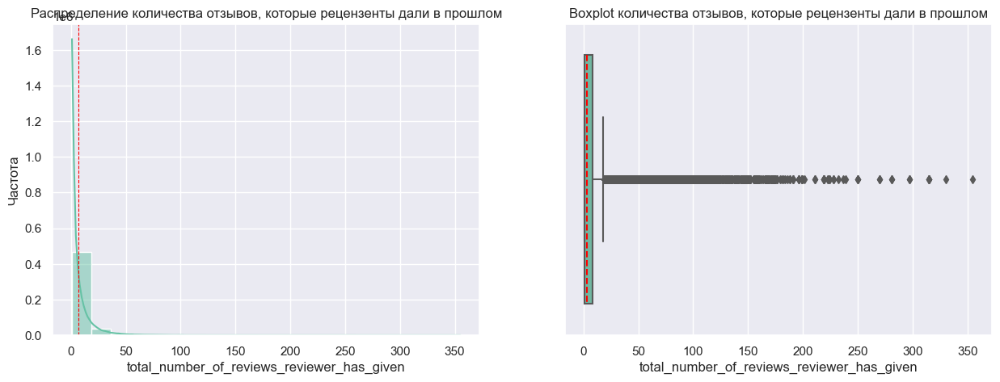

In [132]:
plot_distribution(data, 'total_number_of_reviews_reviewer_has_given',
                  'количества отзывов, которые рецензенты дали в прошлом')

**Вывод** 


Распределение отличается от нормального. Много выбросов.

## 2.13. tags - теги, которые рецензент дал отелю

In [133]:
# Применяем функцию к столбцу 'tags'
data['tags'] = data['tags'].apply(process_tags)


In [134]:
# Импортируем библиотеку для подсчета частоты тегов
from collections import Counter

# Получаем столбец 'tags' из DataFrame
tags_column = data['tags']

# Создаем пустой словарь для хранения частоты тегов
tag_frequency = Counter()

# Проходим по каждой строке и обновляем словарь
for tags_list in tags_column:
    tag_frequency.update(tags_list)

# Преобразуем результат в список словарей
tag_list = [{tag: count} for tag, count in tag_frequency.items()]


# Сортируем tag_list по убыванию частоты
sorted_tag_list = sorted(tag_list, key=lambda x: list(x.values())[0], reverse=True)

# Выводим первые N элементов отсортированного списка
N = TOP_tags  # Замените на нужное вам количество элементов
# print(sorted_tag_list[:N])

#for tag_dict in sorted_tag_list[:N]:
#    tag_key = list(tag_dict.keys())[0]
#    print(tag_key)


In [135]:
top_tags = [next(iter(item.keys())) for item in sorted_tag_list[:N]]
# print(top_tags)

In [136]:
# Новый признак 
data['tags_len'] = data['tags'].apply(lambda x: len(x) if isinstance(x, list) else 0)

#### Генерация новых признаков. Создаем такие, которые есть в Топ тегов

In [137]:
if tag_encoding:
    # Закодируем признак tags
    for tag in top_tags:
        data[tag] = data['tags'].apply(lambda x: 1 if tag in x else 0)

In [138]:
# Вывести облако слов
# show_wordcloud(top_tags)

## 2.14. days_since_review - продолжительность между датой проверки и датой очистки

In [139]:
# data['days_since_review'].value_counts()

In [140]:
# plot_distribution(data, 'days_since_review_int', 'количества дней между датой проверки и датой очистки')

#### Ухудшает MAPE. Признак исключен.

**Проверка на нормальность**

С помощью теста Шапиро-Уилка проверим, распределён ли признак нормально:

*Нулевая гипотеза* ($H_0$): распределение данные является нормальным.

*Альтернативная гипотеза* ($H_1$): распределение данных отлично от нормального.

# 3. Подготовка данных для модели

In [141]:
# убираем признаки которые еще не успели обработать, 
# модель на признаках с dtypes "object" обучаться не будет, просто выберим их и удалим
data.drop(['review_date'], axis = 1, inplace=True)
object_columns = [s for s in data.columns if data[s].dtypes == 'object']
data.drop(object_columns, axis = 1, inplace=True)


# 3.1 Отбор признаков

In [142]:
# Список числовых признаков и список категориальных признаков

all_columns = data.columns

categorical_features = [
    col for col in all_columns if col not in numerical_features]

# Перенесем определенные признаки из категориальных признаков в числовые признаки
if normalize:
    features_to_move = ['year', 'month', 'day', 'weekday']
else:
    features_to_move = ['year', 'month', 'day', 'weekday', 'review_total_word_counts']
numerical_features.extend(features_to_move)


categorical_features = [
    col for col in categorical_features if col not in features_to_move]

# Удаляем 'sample' и 'reviewer_score' из списка numerical_features
numerical_features = [feature for feature in numerical_features if feature not in [
    'sample', 'reviewer_score']]

print('\nКоличество всех признаков:', len(numerical_features)+len(categorical_features))
print('\nКоличество числовых признаков:', len(numerical_features))
print('Список числовых признаков:')
for feature in numerical_features:
    print(feature)

print('\nКоличество категориальных признаков:', len(categorical_features))
print('Список категориальных признаков:')
for feature in categorical_features:
    print(feature)


Количество всех признаков: 86

Количество числовых признаков: 13
Список числовых признаков:
additional_number_of_scoring
average_score
review_total_negative_word_counts
total_number_of_reviews
review_total_positive_word_counts
total_number_of_reviews_reviewer_has_given
lat
lng
year
month
day
weekday
review_total_word_counts

Количество категориальных признаков: 73
Список категориальных признаков:
city_London
city_Paris
city_Amsterdam
city_Milan
city_Vienna
city_Barcelona
chains_hotels
top_reviewer_nationality_ United Kingdom 
top_reviewer_nationality_other
top_reviewer_nationality_ France 
top_reviewer_nationality_ Switzerland 
top_reviewer_nationality_ United Arab Emirates 
top_reviewer_nationality_ South Africa 
top_reviewer_nationality_ United States of America 
top_reviewer_nationality_ Netherlands 
top_reviewer_nationality_ Italy 
top_reviewer_nationality_ Ireland 
top_reviewer_nationality_ Kuwait 
top_reviewer_nationality_ Canada 
top_reviewer_nationality_ Germany 
top_reviewer_

In [143]:
features_to_drop = []

In [144]:
all_features = data.columns.tolist()
print("Имеющиеся признаки в датафрейме:", len(all_features))
#for feature in all_features:
#    print(feature)

Имеющиеся признаки в датафрейме: 88


#### Проверка на отрицательные признаки

In [145]:
# Найти признаки с отрицательными значениями
negative_features = data.columns[(data < 0).any()].tolist()

# Вывести имена признаков с отрицательными значениями
print("Признаки с отрицательными значениями:")
print(negative_features)


Признаки с отрицательными значениями:
['lng', 'afinn_score', 'neg_compound', 'pos_compound', 'negative_sentiment', 'positive_sentiment', 'neg_emotional_intensity', 'pos_emotional_intensity']


In [146]:
# Категориальные признаки с отрицательными значениями
negative_categorical_features = data[categorical_features].columns[(
    data[categorical_features] < 0).any()].tolist()
print(negative_categorical_features)

['afinn_score', 'neg_compound', 'pos_compound', 'negative_sentiment', 'positive_sentiment', 'neg_emotional_intensity', 'pos_emotional_intensity']


In [147]:
# Добавить negative_categorical_feature в numerical_features
numerical_features += negative_categorical_features

# Удалить negative_categorical_feature из categorical_features
categorical_features = list(set(categorical_features) - set(negative_categorical_features))


In [148]:
# Обновление списка  categorical_features перед удалением
categorical_features = [feature for feature in categorical_features if feature not in features_to_drop]

In [149]:
# Общий список признаков в DataFrame
all_features_df = data.columns.tolist()

# Список всех признаков (числовых + категориальных)
all_features = numerical_features + categorical_features

# Находим отсутствующие признаки
missing_features = set(all_features_df) - set(all_features)

# Выводим отсутствующие признаки по одному на новой строке
print("Отсутствующие признаки:")
for feature in missing_features:
    print(feature)


Отсутствующие признаки:
sample
reviewer_score


#### Оценка значимости непрерывных признаков

<AxesSubplot:>

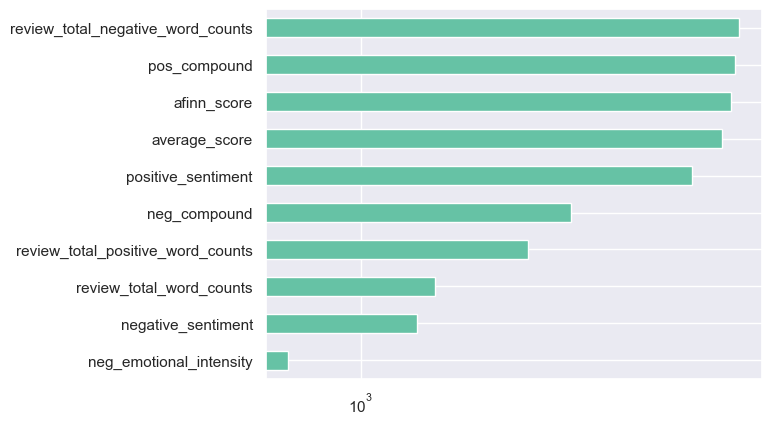

In [150]:
# Для оценки значимости непрерывных признаков будем использовать функцию f_classif из библиотеки sklearn.
X = data.query('sample == 1').drop(['sample'], axis=1)[numerical_features]
y = data.query('sample == 1').drop(
    ['sample'], axis=1).reviewer_score.values.astype('int')
imp_num = pd.Series(f_classif(X, y)[0], index=numerical_features)
imp_num.sort_values(inplace=True)
plt.xscale('log')
imp_num.nlargest(10).sort_values().plot(kind='barh')

In [151]:
imp_num.nlargest(20).sort_values()

day                                              0.954821
weekday                                          5.086048
year                                            29.735462
month                                           52.821599
lat                                             75.328549
lng                                             92.462333
additional_number_of_scoring                   211.415581
total_number_of_reviews                        278.207325
total_number_of_reviews_reviewer_has_given     300.284423
pos_emotional_intensity                        371.269545
neg_emotional_intensity                        667.720734
negative_sentiment                            1371.394394
review_total_word_counts                      1519.656072
review_total_positive_word_counts             2554.120021
neg_compound                                  3247.091509
positive_sentiment                            6414.116415
average_score                                 7599.158955
afinn_score   

#### Оценка значимости категориальных признаков

<AxesSubplot:>

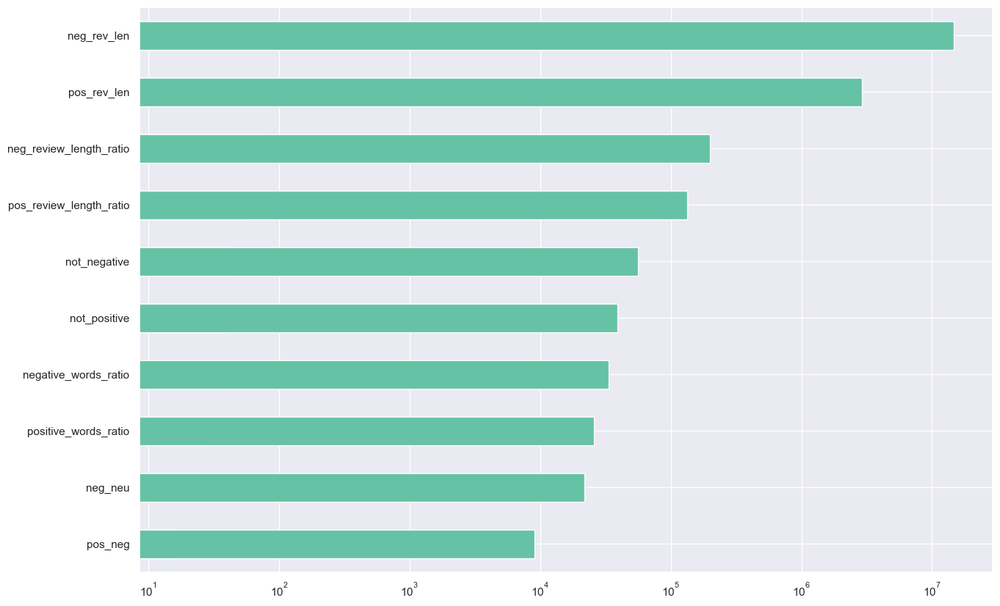

In [152]:
# Для оценки значимости категориальных признаков будем использовать непараметрический тест хи-квадрат.
X = data.query('sample == 1').drop(['sample'], axis=1)[categorical_features]
y = data.query('sample == 1').drop(['sample'], axis=1).reviewer_score.values.astype('int')

plt.rcParams['figure.figsize'] = (15, 10)
imp_cat = pd.Series(chi2(X, y)[0], index=categorical_features)
imp_cat.sort_values(inplace=True)

imp_cat.plot(kind='barh')
plt.xscale('log')
imp_cat.nlargest(10).sort_values().plot(kind='barh')


In [153]:
imp_cat.nlargest(20).sort_values()

Leisure trip                                           1.010959e+03
chains_hotels                                          1.300534e+03
sentiment_overlap_encoded                              1.384546e+03
top_reviewer_nationality_other                         1.554578e+03
Solo traveler                                          2.247655e+03
top_reviewer_nationality_ United States of America     2.254682e+03
pos_average_score                                      2.734744e+03
Business trip                                          4.207179e+03
neg_average_score                                      4.503279e+03
neg_neg                                                5.464188e+03
pos_neg                                                8.996263e+03
neg_neu                                                2.184216e+04
positive_words_ratio                                   2.568741e+04
negative_words_ratio                                   3.346339e+04
not_positive                                    

In [154]:
if drop_less_sign_cat_features:
    # Оставим только найболее значимую часть категориальных признаков
    less_sign_cat_features = imp_cat[imp_cat.values < imp_cat.median()]
    
    exclude_cat_features = list(less_sign_cat_features.index)
    # Удаление признаков
    data.drop(less_sign_cat_features.index, axis = 1, inplace=True) 
    features_to_drop.extend(list(less_sign_cat_features.index))
    # Обновление списков  categorical_features после удаления
    categorical_features = [feature for feature in categorical_features if feature in data.columns]
    exclude_cat_features

#### Тепловая матрица корреляций

In [155]:
corr_matrix = data.corr()
corr_matrix = corr_matrix.drop('sample', axis=0)
corr_matrix = corr_matrix.drop('sample', axis=1)

<AxesSubplot:>

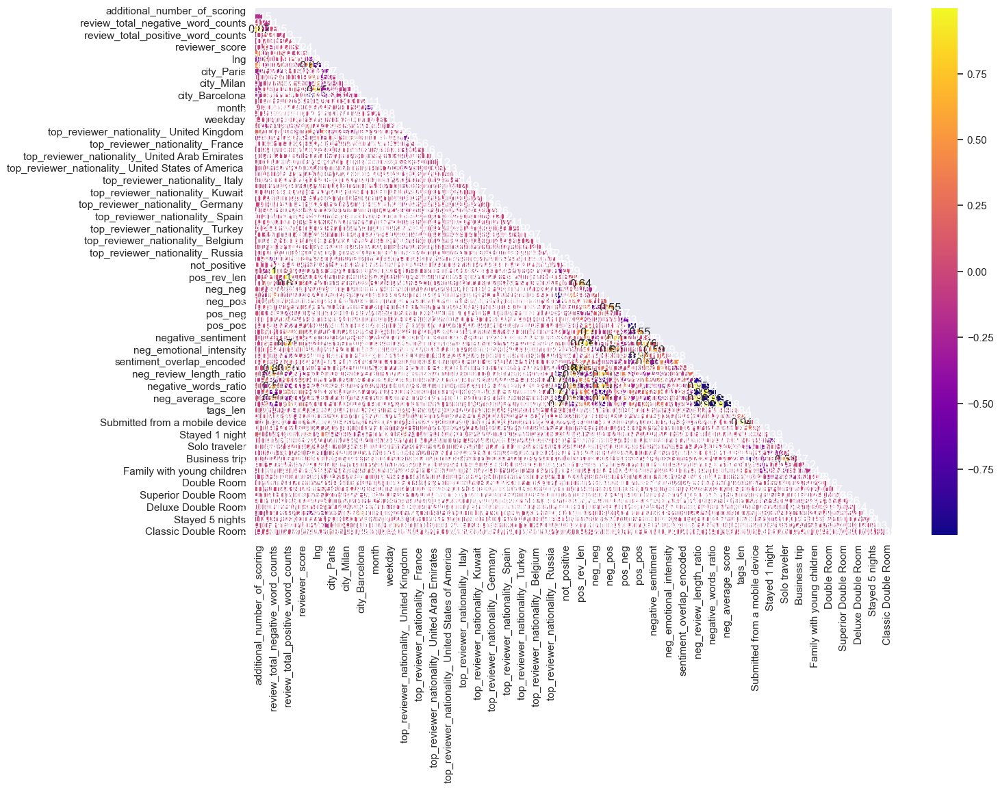

In [156]:
mask = np.triu(np.ones_like(corr_matrix, dtype=bool))
plt.rcParams['figure.figsize'] = (15,10)
sns.heatmap(corr_matrix, mask = mask, cmap='plasma', annot=True)

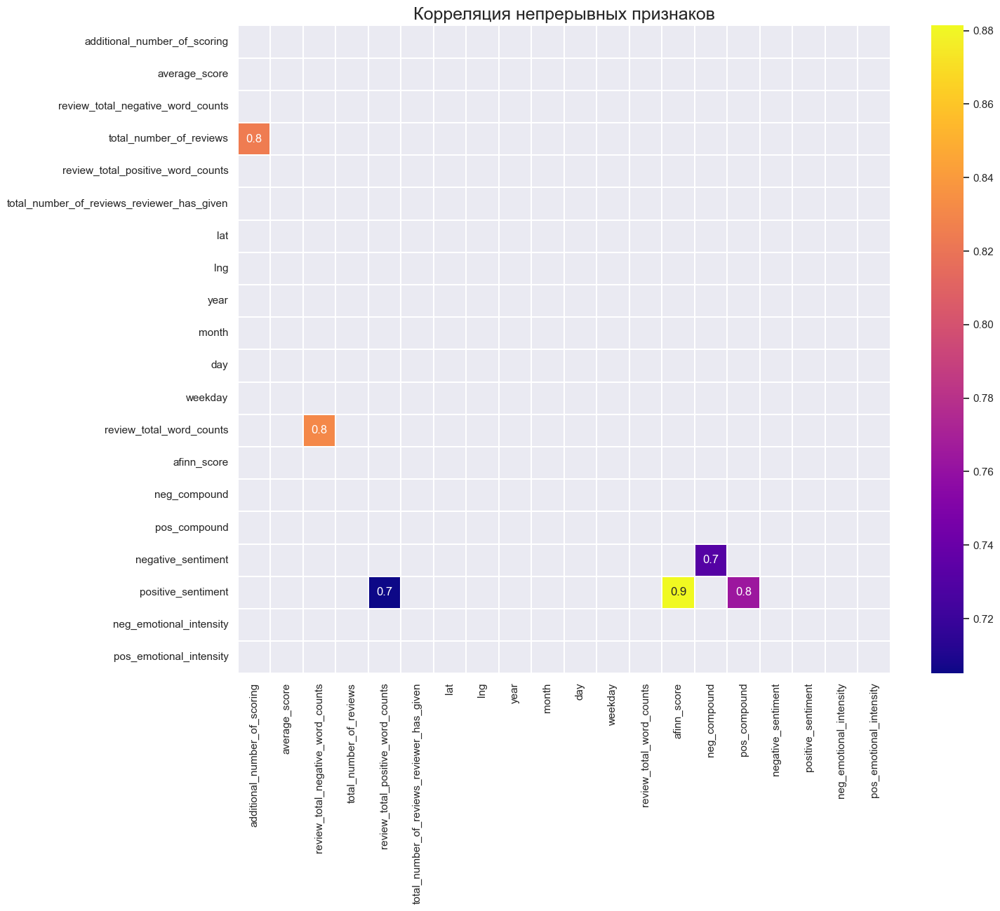

Коррелирующие признаки:
additional_number_of_scoring и total_number_of_reviews
review_total_negative_word_counts и review_total_word_counts
review_total_positive_word_counts и positive_sentiment
afinn_score и positive_sentiment
neg_compound и negative_sentiment
pos_compound и positive_sentiment


In [157]:
high_corr_num_features1, high_corr_num_features2 = triang_corr_heatmap(
    data, numerical_features, 'Корреляция непрерывных признаков',
    exclude_features=['sample'], method='pearson', corr_coeff_threshold=threshold_num)


In [158]:
print(high_corr_num_features1)
print(high_corr_num_features2)

['neg_compound', 'additional_number_of_scoring', 'pos_compound', 'review_total_positive_word_counts', 'review_total_negative_word_counts', 'afinn_score']
['positive_sentiment', 'review_total_word_counts', 'total_number_of_reviews', 'negative_sentiment']


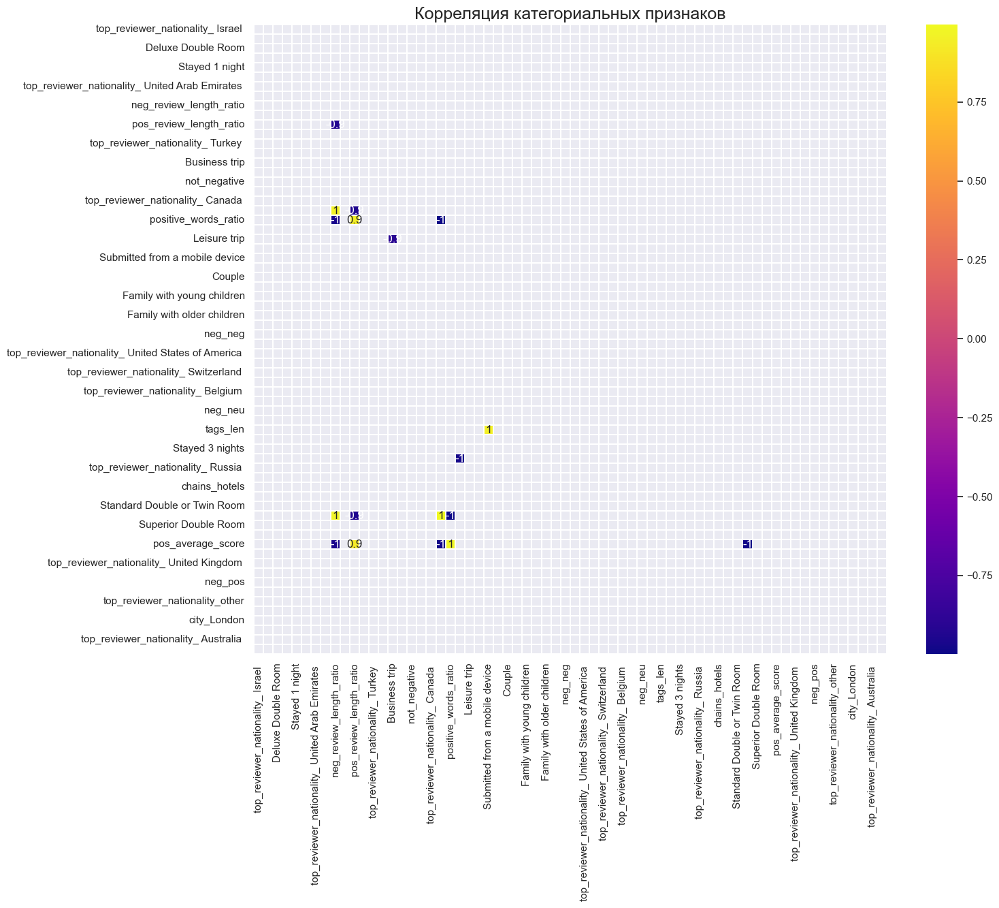

Коррелирующие признаки:
neg_review_length_ratio и pos_review_length_ratio
neg_review_length_ratio и neg_average_score
neg_review_length_ratio и positive_words_ratio
neg_review_length_ratio и negative_words_ratio
neg_review_length_ratio и pos_average_score
pos_review_length_ratio и neg_average_score
pos_review_length_ratio и positive_words_ratio
pos_review_length_ratio и negative_words_ratio
pos_review_length_ratio и pos_average_score
Business trip и Leisure trip
neg_average_score и positive_words_ratio
neg_average_score и negative_words_ratio
neg_average_score и pos_average_score
positive_words_ratio и negative_words_ratio
positive_words_ratio и pos_average_score
pos_pos и pos_neu
Submitted from a mobile device и tags_len
negative_words_ratio и pos_average_score


In [159]:
high_corr_cut_features1, high_corr_cut_features2 = triang_corr_heatmap(
    data, categorical_features, 'Корреляция категориальных признаков', 
    exclude_features=None, method='spearman', corr_coeff_threshold=threshold_cut)

In [160]:
print(high_corr_cut_features1)
print(high_corr_cut_features2)

['negative_words_ratio', 'Business trip', 'Submitted from a mobile device', 'neg_average_score', 'positive_words_ratio', 'neg_review_length_ratio', 'pos_pos', 'pos_review_length_ratio']
['negative_words_ratio', 'pos_neu', 'neg_average_score', 'pos_average_score', 'positive_words_ratio', 'tags_len', 'Leisure trip', 'pos_review_length_ratio']


In [161]:
if drop_variant1:
    # Вариант 1: high_corr_num_features1 + high_corr_num_features2
    features_to_drop_variant1 = high_corr_num_features1 + high_corr_num_features2

    # Удаление признаков для варианта 1
    data.drop(features_to_drop_variant1, axis=1, inplace=True)
    features_to_drop.extend(features_to_drop_variant1)
    # Обновление списков numerical_features и categorical_features после удаления
    numerical_features = [feature for feature in numerical_features if feature in data.columns]
    categorical_features = [feature for feature in categorical_features if feature in data.columns]
    #features_to_drop = features_to_drop_variant1

In [162]:
if drop_variant2:
    # Вариант 2: high_corr_cut_features1 + high_corr_cut_features2
    features_to_drop_variant2 = high_corr_cut_features1 + high_corr_cut_features2

    # Удаление признаков для варианта 2
    data.drop(features_to_drop_variant2, axis=1, inplace=True)
    #features_to_drop = features_to_drop_variant2
    features_to_drop.extend(features_to_drop_variant2)
    # Обновление списков numerical_features и categorical_features после удаления
    numerical_features = [feature for feature in numerical_features if feature in data.columns]
    categorical_features = [feature for feature in categorical_features if feature in data.columns]

In [163]:
if drop_variant3:
    features_to_drop_variant3 = high_corr_num_features1 + high_corr_cut_features1

    # Удаление признаков для варианта 3
    data.drop(features_to_drop_variant3, axis=1, inplace=True)
    #features_to_drop = features_to_drop_variant3
    features_to_drop.extend(features_to_drop_variant3)
    # Обновление списков numerical_features и categorical_features после удаления
    numerical_features = [feature for feature in numerical_features if feature in data.columns]
    categorical_features = [feature for feature in categorical_features if feature in data.columns]

In [164]:
if drop_variant4:
    features_to_drop_variant4 = high_corr_num_features2 + high_corr_cut_features2

    # Удаление признаков для варианта 4
    data.drop(features_to_drop_variant4, axis=1, inplace=True)
    #features_to_drop = features_to_drop_variant4
    features_to_drop.extend(features_to_drop_variant4)
    # Обновление списков numerical_features и categorical_features после удаления
    numerical_features = [feature for feature in numerical_features if feature in data.columns]
    categorical_features = [feature for feature in categorical_features if feature in data.columns]

#### manual_feature_removal

In [165]:
# Удалим часть признаков, без которых MAPE лучше
if manual_removal:

    if normalize:
        manual_feature_removal = ['additional_number_of_scoring', 'norm_review_total_negative_word_counts',
                              'norm_review_total_word_counts', 'total_number_of_reviews']
    
    else:
        manual_feature_removal = ['additional_number_of_scoring', 'review_total_negative_word_counts',
                              'review_total_word_counts', 'total_number_of_reviews']
    
    '''
    if normalize:
        manual_feature_removal = [
            'additional_number_of_scoring', 'norm_review_total_negative_word_counts']

    else:
        manual_feature_removal = [
            'additional_number_of_scoring', 'review_total_negative_word_counts']
    '''

    data.drop(manual_feature_removal, axis=1, inplace=True)
    features_to_drop.extend(manual_feature_removal)

In [166]:
# Проверка на наличие NaN в DataFrame
nan_values = data.isna().sum()

# Вывод столбцов с пропущенными значениями
columns_with_nan = nan_values[nan_values > 0].index
print(f"Столбцы с пропущенными значениями:\n{columns_with_nan}")


Столбцы с пропущенными значениями:
Index([], dtype='object')


In [167]:
# Проверка на наличие бесконечностей в DataFrame
inf_values = np.any(np.isinf(data))

# Вывод столбцов с бесконечными значениями
columns_with_inf = data.columns[np.any(np.isinf(data), axis=0)].tolist()
print(f"Столбцы с бесконечными значениями:\n{columns_with_inf}")


Столбцы с бесконечными значениями:
[]


## 3.2. Подготовка к обучению модели

In [168]:
# Теперь выделим тестовую часть
train_data = data.query('sample == 1').drop(['sample'], axis=1)
test_data = data.query('sample == 0').drop(['sample'], axis=1)

# Разбиваем датафрейм на части, необходимые для обучения и тестирования модели
# Х - данные с информацией об отелях, у - целевая переменная (рейтинги отелей)
X = train_data.drop(['reviewer_score'], axis=1)
y = train_data['reviewer_score'].values

In [169]:
# Воспользуемся специальной функцие train_test_split для разбивки тестовых данных
# Наборы данных с меткой "train" будут использоваться для обучения модели, "test" - для тестирования.
# Выделим 25% данных на валидацию (параметр test_size)
X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.25, random_state=RANDOM_SEED)

In [170]:
# Проверяем
test_data.shape, train_data.shape, X.shape, X_train.shape, X_test.shape

((128935, 83), (386803, 83), (386803, 82), (290102, 82), (96701, 82))

In [171]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 515738 entries, 0 to 515737
Data columns (total 84 columns):
 #   Column                                               Non-Null Count   Dtype  
---  ------                                               --------------   -----  
 0   average_score                                        515738 non-null  float64
 1   review_total_positive_word_counts                    515738 non-null  int64  
 2   total_number_of_reviews_reviewer_has_given           515738 non-null  int64  
 3   reviewer_score                                       515738 non-null  float64
 4   lat                                                  515738 non-null  float64
 5   lng                                                  515738 non-null  float64
 6   sample                                               515738 non-null  int64  
 7   city_London                                          515738 non-null  int64  
 8   city_Paris                                           5

# 4. Обучаем модель  RandomForestRegressor

In [172]:
# Создаём модель (НАСТРОЙКИ НЕ ТРОГАЕМ)
model = RandomForestRegressor(n_estimators=100, verbose=1, n_jobs=-1, random_state=RANDOM_SEED)

In [173]:
# Обучаем модель на тестовом наборе данных
model.fit(X_train, y_train)

# Используем обученную модель для предсказания рейтинга ресторанов в тестовой выборке.
# Предсказанные значения записываем в переменную y_pred
y_pred = model.predict(X_test)

[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 4 concurrent workers.
[Parallel(n_jobs=-1)]: Done  42 tasks      | elapsed:  2.6min
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:  5.5min finished
[Parallel(n_jobs=4)]: Using backend ThreadingBackend with 4 concurrent workers.
[Parallel(n_jobs=4)]: Done  42 tasks      | elapsed:    0.7s
[Parallel(n_jobs=4)]: Done 100 out of 100 | elapsed:    1.8s finished


In [174]:
# Сравниваем предсказанные значения (y_pred) с реальными (y_test), и смотрим насколько они в среднем отличаются
# Метрика называется Mean Absolute Error (MAE) и показывает среднее отклонение предсказанных значений от фактических.
print('MAE:', metrics.mean_absolute_error(y_test, y_pred))

MAE: 0.8487173969245403


In [175]:
# Сравниваем предсказанные значения (y_pred) с реальными (y_test), и смотрим насколько они отличаются  
# Метрика называется Mean Absolute Percentage Error (MAPE) и показывает среднюю абсолютную процентную ошибку предсказанных значений от фактических.  
print('MAPE:', metrics.mean_absolute_percentage_error(y_test, y_pred))
print('Топ национальностей:', TOP_N, 'Топ тегов:', TOP_tags)
print('Количество числовых признаков:', len(numerical_features)) 
print('Количество категориальных признаков:', len(categorical_features))

MAPE: 0.12062662931990716
Топ национальностей: 20 Топ тегов: 20
Количество числовых признаков: 20
Количество категориальных признаков: 66


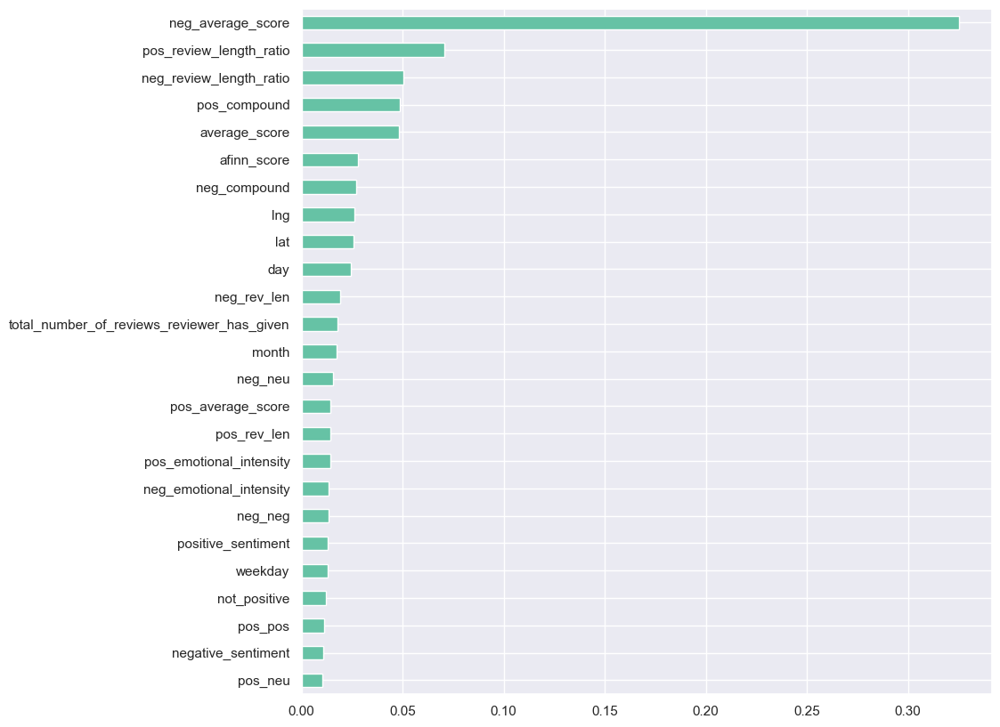

In [176]:
# В RandomForestRegressor есть возможность вывести самые важные признаки для модели
plt.rcParams['figure.figsize'] = (10,10)
feat_importances = pd.Series(model.feature_importances_, index=X.columns)
feat_importances.nlargest(25).sort_values(ascending=True).plot(kind='barh');

In [177]:
test_data.sample(10)

,average_score,review_total_positive_word_counts,total_number_of_reviews_reviewer_has_given,reviewer_score,lat,lng,city_London,city_Paris,city_Amsterdam,city_Milan,city_Vienna,city_Barcelona,year,month,day,weekday,chains_hotels,top_reviewer_nationality_ United Kingdom,top_reviewer_nationality_other,top_reviewer_nationality_ France,top_reviewer_nationality_ Switzerland,top_reviewer_nationality_ United Arab Emirates,top_reviewer_nationality_ South Africa,top_reviewer_nationality_ United States of America,top_reviewer_nationality_ Netherlands,top_reviewer_nationality_ Italy,top_reviewer_nationality_ Ireland,top_reviewer_nationality_ Kuwait,top_reviewer_nationality_ Canada,top_reviewer_nationality_ Germany,top_reviewer_nationality_ Australia,top_reviewer_nationality_ Spain,top_reviewer_nationality_ Israel,top_reviewer_nationality_ Turkey,top_reviewer_nationality_ Romania,top_reviewer_nationality_ Belgium,top_reviewer_nationality_ Saudi Arabia,top_reviewer_nationality_ Russia,not_negative,not_positive,neg_rev_len,pos_rev_len,afinn_score,neg_neg,neg_neu,neg_pos,neg_compound,pos_neg,pos_neu,pos_pos,pos_compound,negative_sentiment,positive_sentiment,neg_emotional_intensity,pos_emotional_intensity,sentiment_overlap_encoded,neg_review_length_ratio,pos_review_length_ratio,negative_words_ratio,positive_words_ratio,neg_average_score,pos_average_score,tags_len,Leisure trip,Submitted from a mobile device,Couple,Stayed 1 night,Stayed 2 nights,Solo traveler,Stayed 3 nights,Business trip,Group,Family with young children,Stayed 4 nights,Double Room,Standard Double Room,Superior Double Room,Family with older children,Deluxe Double Room,Double or Twin Room,Stayed 5 nights,Standard Double or Twin Room,Classic Double Room
452114,9.2,33,5,0.0,48.207158,16.376591,0,0,0,0,1,0,2016,9,30,5,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,193,24.0,0.000,0.000,0.000,0.0000,0.000,0.438,0.562,0.9798,0.0000,4.0883,0.000000,0.021183,1,0.000000,5.848485,0.000000,1.000000,0.000000,0.108696,5,1,1,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0
472925,8.8,40,23,0.0,41.373246,2.147435,0,0,0,0,0,1,2017,2,22,3,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,153,218,19.0,0.067,0.736,0.196,0.6369,0.000,0.628,0.372,0.9636,0.6778,2.8090,0.004430,0.012885,1,2.185714,3.114286,0.428571,0.571429,0.048701,0.064935,5,1,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,0,0
394255,7.1,7,8,0.0,51.501910,-0.023221,1,0,0,0,0,0,2016,5,18,3,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,51,0.0,0.000,0.000,0.000,0.0000,0.000,1.000,0.000,0.0000,0.0000,0.0000,0.000000,0.000000,0,0.000000,7.285714,0.000000,1.000000,0.000000,0.140845,4,1,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0
414443,8.3,3,1,0.0,51.524139,-0.138081,1,0,0,0,0,0,2016,7,5,2,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,87,15,-1.0,0.096,0.904,0.000,-0.1779,0.000,0.196,0.804,0.6249,-0.1779,0.6249,-0.002045,0.041660,1,3.954545,0.681818,0.863636,0.136364,0.104053,0.016429,5,1,1,1,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0
430926,7.6,24,2,0.0,51.511945,-0.179939,1,0,0,0,0,0,2016,7,8,5,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,84,126,10.0,0.125,0.875,0.000,-0.2500,0.000,0.427,0.573,0.9592,-0.2500,2.8113,-0.002976,0.022312,1,2.048780,3.073171,0.414634,0.585366,0.054557,0.077022,5,1,1,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
473608,8.2,5,37,0.0,51.491908,-0.168440,1,0,0,0,0,0,2015,11,1,7,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,29,24,1.0,0.459,0.541,0.000,-0.5256,0.000,0.423,0.577,0.6249,-0.4767,0.6249,-0.016438,0.026038,1,2.636364,2.181818,0.545455,0.454545,0.066519,0.055432,4,1,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0
456437,8.1,3,1,0.0,48.846837,2.325807,0,1,0,0,0,0,2017,8,1,2,1,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,62,14,-3.0,0.280,0.720,0.000,-0.5423,0.000,1.000,0.000,0.0000,-0.5423,0.0000,-0.008747,0.000000,1,4.133333,0.933333,0.800000,0.200000,0.098765,0.024691,4,0,1,1,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
470853,8.2,20,1,0.0,51.524125,-0.125807,1,0,0,0,0,0,2016,12,29,4,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,49,113,14.0,0.000,1.000,0.000,0.

In [178]:
test_data = test_data.drop(['reviewer_score'], axis=1)

In [179]:
sample_submission

,reviewer_score,id
0,1,488440
1,10,274649
2,3,374688
3,10,404352
4,9,451596
...,...,...
128930,7,495812
128931,1,315577
128932,3,511968
128933,6,303386


In [180]:
predict_submission = model.predict(test_data)

[Parallel(n_jobs=4)]: Using backend ThreadingBackend with 4 concurrent workers.
[Parallel(n_jobs=4)]: Done  42 tasks      | elapsed:    1.0s
[Parallel(n_jobs=4)]: Done 100 out of 100 | elapsed:    2.5s finished


In [181]:
predict_submission

array([8.597, 7.707, 8.49 , ..., 8.181, 9.551, 7.198])

In [182]:
list(sample_submission)

['reviewer_score', 'id']

In [183]:
sample_submission['reviewer_score'] = predict_submission
sample_submission.to_csv('submission.csv', index=False)
sample_submission.head(10)

,reviewer_score,id
0,8.597,488440
1,7.707,274649
2,8.490,374688
3,9.713,404352
4,9.714,451596
5,8.628,302161
6,7.311,317079
7,7.845,13963
8,8.657,159785
9,7.887,195089


# 5. Результат работы модели

In [184]:
# Получаем информацию о процессоре
processor_info = platform.processor()

# Получаем информацию о доступной оперативной памяти
ram_info = psutil.virtual_memory()
ram_size_gb = ram_info.total / (1024 ** 3)  # конвертируем в гигабайты

# Вычисляем общее время выполнения блокнота
end_time = time.time()
total_time_seconds = end_time - start_time
total_time_minutes = total_time_seconds / 60

# Получим текущую дату и время
current_datetime = datetime.now()
formatted_datetime = current_datetime.strftime("%Y-%m-%d %H:%M:%S")

In [185]:
# Выводим информацию о процессоре и оперативной памяти

print(' - Среда выполнения')
print(f"   - Модель процессора: {processor_info}")
print(f"   - Количество оперативной памяти: {ram_size_gb:.2f} ГБ")

# Выводим общее время выполнения блокнота в минутах, а также текущую дату и время
print('\n - Дата и длителность выполнения')
print(f"   - Общее время выполнения: {total_time_minutes:.2f} минут")
print(f"   - Текущая дата и время: {formatted_datetime}")

# Метрика называется Mean Absolute Percentage Error (MAPE) и показывает среднюю абсолютную процентную ошибку предсказанных значений от фактических.  
print('\n - MAPE:', metrics.mean_absolute_percentage_error(y_test, y_pred))
print('    - Топ национальностей:', TOP_N, 'Топ тегов:', TOP_tags)
print('    - Количество числовых признаков:', len(numerical_features)) 
print('    - Количество категориальных признаков:', len(categorical_features))
print('    - Пороговые значения коэффициентов корреляции:')
print('       - для непрерывных признаков:   ', threshold_num)
print('       - для категориальных признаков:', threshold_cut)
print('    - AFINN:', afinn_encoding)
print('    - NLTK:', sia_combined_features_encoding)
print('    - Нормализация:', normalize)
print('    - Удаленные признаки:', features_to_drop)


 - Среда выполнения
   - Модель процессора: Intel64 Family 6 Model 58 Stepping 9, GenuineIntel
   - Количество оперативной памяти: 31.69 ГБ

 - Дата и длителность выполнения
   - Общее время выполнения: 40.31 минут
   - Текущая дата и время: 2023-11-23 23:57:23

 - MAPE: 0.12062662931990716
    - Топ национальностей: 20 Топ тегов: 20
    - Количество числовых признаков: 20
    - Количество категориальных признаков: 66
    - Пороговые значения коэффициентов корреляции:
       - для непрерывных признаков:    0.7
       - для категориальных признаков: 0.9
    - AFINN: True
    - NLTK: True
    - Нормализация: False
    - Удаленные признаки: ['additional_number_of_scoring', 'review_total_negative_word_counts', 'review_total_word_counts', 'total_number_of_reviews']


In [186]:
# Сигнал о завершении работы
pygame.mixer.music.play()

# 6. Сравнение результатов

- 0.12868177701180920 simple - Нормализация: True 
- 0.12864765811529602 simple - Нормализация: False 
- 0.12084275345719722 AFINN,NLTK - Нормализация: False, 10, 10
- 0.12861682317364553 simple - Нормализация: False, auto - Удаленные признаки: 
- 0.12861056166724752 simple - Нормализация: False, manual - Удаленные признаки:
- 0.12860953917563460 simple - Нормализация: True, manual - Удаленные признаки:
- 0.12862001456957228 simple - Нормализация: True, manual - Удаленные признаки: lng, lat
- 0.12870111525287908 simple - Нормализация: True, manual - Удаленные признаки: month
- 0.12860953917563460 simple - Нормализация: True, manual - Удаленные признаки:
- 0.12076228459255678 AFINN,NLTK 10,  10, - Нормализация: True, manual - Удаленные признаки:
- 0.12061951311256329 AFINN,NLTK 100, 40, - Нормализация: True, manual - Удаленные признаки:
- 0.12064352167896544 AFINN,NLTK 100, 40, - Нормализация: False, manual - Удаленные признаки:
- 0.12869248462193820 simple - Нормализация: False,  'neg_word_density_ratio' и 'pos_word_density_ratio'
- 0.12861056166724752 simple - Нормализация: False
- 0.12050312549343709 AFINN,NLTK 100, 200, - Нормализация: False, manual - Удаленные признаки: 2
- 0.12065543392052086 AFINN,NLTK 100, 0, - Нормализация: False, manual - Удаленные признаки: 4
- 0.12037086998863160 AFINN,NLTK 100, 200, - Нормализация: False, manual - Удаленные признаки: 4
- 0.12062662931990716 AFINN,NLTK 20, 20, - Нормализация: False, manual - Удаленные признаки: 4

# 7. Выводы

При подготовке к обучению модели для уточнения рейтинга отеля была проделана большая работа:
- Осуществлена первичная обработка данных;
- С помощью библиотеки geocoder были заполнены пропуски в координатах;
- Проведен разведывательный анализ данных;
- Созданы новые признаки и удалены признаки, увеличивающие MAPE
- Удаление коррелированных признаков приводило к увеличению MAPE, удалил лишь небольшую часть признаков
- Нормализация также неоднозначно сказалась на MAPE, причем влияние было различным в зависимости от среды исполнения. Так в Jupiter notebook нормализация простых моделей увеличивало  MAPE, а в более сложных моделях MAPE становилась меньше. На kaggle тот же код давал другие результаты. Нормализация не на много, но увеличивала MAPE, далее пример:
    - 0.12868177701180920 simple, Нормализация: True 
    - 0.12864765811529602 simple, Нормализация: False 
    - 0.12061951311256329 AFINN,NLTK, Нормализация: True, Удаленные признаки
    - 0.12064352167896544 AFINN,NLTK, Нормализация: False, Удаленные признаки;

- Наибольший вклад в уменьшение MAPE внесли признаки с отзывами и метода работы с ними: Afinn, NTLK.

В итоге MAPE снизилась с 14.15449 до 12.14284.